# Compare the v3.2 recalibrated SDSS Stripe82 catalog 
# and the DES catalog

### use the SDSS g-i color and linear interpolation for bandpass transformations 

[Link to helper tools](#dataTools) 

[Link to data reading](#dataReading) 

[Link to data analysis](#dataAnalysis) 

In [1]:
%matplotlib inline
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.table import hstack
import matplotlib.pyplot as plt 
import numpy as np
from astroML.plotting import hist
# for astroML installation see https://www.astroml.org/user_guide/installation.html

In [2]:
## automatically reload any modules read below that might have changed (e.g. plots)
%load_ext autoreload
%autoreload 2
# importing ZI tools: 
import ZItools as zit
# importing Karun's tools: 
import KTtools as ktt

<a id='dataTools'></a>

### Helper Tools

In [3]:
# robust standard deviation
def sigG(arr):
    return 0.741*(np.quantile(arr, 0.75)-np.quantile(arr, 0.25))

In [4]:
### code for generating new quantities, such as dra, ddec, colors, differences in mags, etc
def derivedColumns(matches, newFlag=1):
    matches['ra'] = matches['ra_new']
    matches['dec'] = matches['dec_new']
    matches['dra'] = (matches['ra']-matches['raDES'])*3600
    matches['ddec'] = (matches['dec']-matches['decDES'])*3600
    ra = matches['ra'] 
    matches['raW'] = np.where(ra > 180, ra-360, ra) 
    if (newFlag):
        matches['u_mMed'] = matches['u_mMed_new']
        matches['g_mMed'] = matches['g_mMed_new']
        matches['r_mMed'] = matches['r_mMed_new']
        matches['i_mMed'] = matches['i_mMed_new']
        matches['z_mMed'] = matches['z_mMed_new']
    matches['dg'] = matches['g_mMed'] - matches['gDES'] 
    matches['dr'] = matches['r_mMed'] - matches['rDES'] 
    matches['di'] = matches['i_mMed'] - matches['iDES'] 
    matches['dz'] = matches['z_mMed'] - matches['zDES'] 
    matches['gr'] = matches['g_mMed'] - matches['r_mMed']
    matches['ri'] = matches['r_mMed'] - matches['i_mMed']
    matches['gi'] = matches['g_mMed'] - matches['i_mMed']
    matches['iz'] = matches['i_mMed'] - matches['z_mMed']
    matches['dgr'] = matches['dg'] - matches['dr'] 
    matches['dri'] = matches['dr'] - matches['di'] 
    matches['diz'] = matches['di'] - matches['dz'] 
    matches['drz'] = matches['dr'] - matches['dz'] 
    matches['dgi'] = matches['dg'] - matches['di'] 
    return

In [5]:
def doOneColor(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    # this is where the useable range of color specified by Xstr is defined
    # it's really a hack - these limits should be passed via kw... 
    xMin = 0.5
    xMax = 3.1
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, xMin, xMax, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    # THERE IS NO ANALYTIC COLOR TERM: linear interpolation of the binned medians! 
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    # the following line corrects the trend given by the binned medians 
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    # note that we only use the restricted range of color for ZP analysis
    # 0.3 mag limit is to reject gross outliers
    goodC = d[(np.abs(d['colorresid'])<0.3)&(xVec>xMin)&(xVec<xMax)]
    
    ### plots 
    # RA
    print(' stats for RA binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_RA.png'
    Ylabel =kw['Ystr'] + ' residuals'
    kwOC = {"Xstr":'raW', "Xmin":-45, "Xmax":47, "Xlabel":'R.A. (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-43, "XmaxBin":45, "nBin":56, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    plotName = plotNameRoot + '_RA_Hess.png'    
    kwOC["plotName"] = plotName
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(goodC, kwOC)  
    print('made plot', plotName)


    # Dec
    print('-----------')
    print(' stats for Dec binning medians:')
    plotName = plotNameRoot + '_Dec.png'
    kwOC = {"Xstr":'dec', "Xmin":-1.3, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-1.26, "XmaxBin":1.26, "nBin":52, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    plotName = plotNameRoot + '_Dec_Hess.png'    
    kwOC["plotName"] = plotName
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(goodC, kwOC)  
    print('made plot', plotName)


    # r SDSS
    print('-----------')
    print(' stats for SDSS r binning medians:')
    plotName = plotNameRoot + '_rmag.png'    
    kwOC = {"Xstr":'r_mMed', "Xmin":14.3, "Xmax":22.2, "Xlabel":'SDSS r (mag)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":14.5, "XmaxBin":21.5, "nBin":55, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    plotName = plotNameRoot + '_rmag_Hess.png'    
    kwOC["plotName"] = plotName
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(goodC, kwOC)  
    print('made plot', plotName)
    print('------------------------------------------------------------------')
   

<a id='dataReading'></a>

### Define paths and catalogs 

In [6]:
ZIdataDir = "/Users/ivezic/Work/Science/CalibrationV2/SDSS_SSC/Data"
# Doug's match of v3.2 and DES catalog  
DEScatalog = ZIdataDir + "/" + "match_stripe82calibStars_v3.2_des_dr1_cleaned.csv" 
colnamesSDSSDES = ['calib_fla', 'ra', 'dec', 'raRMS', 'decRMS', 'nEpochs', 'AR_val', 
                'u_Nobs', 'u_mMed', 'u_mMean', 'u_mErr', 'u_rms_scatt', 'u_chi2',
                'g_Nobs', 'g_mMed', 'g_mMean', 'g_mErr', 'g_rms_scatt', 'g_chi2',
                'r_Nobs', 'r_mMed', 'r_mMean', 'r_mErr', 'r_rms_scatt', 'r_chi2',
                'i_Nobs', 'i_mMed', 'i_mMean', 'i_mErr', 'i_rms_scatt', 'i_chi2',
                'z_Nobs', 'z_mMed', 'z_mMean', 'z_mErr', 'z_rms_scatt', 'z_chi2', 
                'idDES', 'raDES', 'decDES', 
                'gDES', 'rDES', 'iDES', 'zDES', 'yDES', 
                'gErrDES', 'rErrDES', 'iErrDES', 'zErrDES', 'yErrDES', 
                'gNobsDES', 'rNobsDES', 'iNobsDES', 'zNobsDES', 'yNobsDES', 'sep']

In [7]:
sdssDESraw = Table.read(DEScatalog, format='csv', names=colnamesSDSSDES) 
print(np.size(sdssDESraw))

619741


<a id='dataReading'></a>

### Overwrite SDSS catalog with a new one!

In [8]:
## read the latest and greatest SDSS catalog
colnamesSDSS = ['calib_fla', 'ra', 'dec', 'raRMS', 'decRMS', 'nEpochs', 'AR_val', 
                'u_Nobs', 'u_mMed', 'u_mMean', 'u_mErr', 'u_rms_scatt', 'u_chi2',
                'g_Nobs', 'g_mMed', 'g_mMean', 'g_mErr', 'g_rms_scatt', 'g_chi2',
                'r_Nobs', 'r_mMed', 'r_mMean', 'r_mErr', 'r_rms_scatt', 'r_chi2',
                'i_Nobs', 'i_mMed', 'i_mMean', 'i_mErr', 'i_rms_scatt', 'i_chi2',
                'z_Nobs', 'z_mMed', 'z_mMean', 'z_mErr', 'z_rms_scatt', 'z_chi2']

sdssNewCatIn = ZIdataDir + "/" + "stripe82calibStars_v3.4.dat"
# sdssNewCatIn = ZIdataDir + "/" + "stripe82calibStars_v3.1.dat"

readFormat = 'ascii'
sdssNew = Table.read(sdssNewCatIn, format=readFormat, names=colnamesSDSS)
np.size(sdssNew)

991472

In [9]:
## now match sdssDES to sdssNew 
sdssDES_coords = SkyCoord(ra = sdssDESraw['ra']*u.degree, dec= sdssDESraw['dec']*u.degree) 
sdssNew_coords = SkyCoord(ra = sdssNew['ra']*u.degree, dec= sdssNew['dec']*u.degree) 
idx, d2d, d3d = sdssNew_coords.match_to_catalog_sky(sdssDES_coords)  
sdssDESnew = hstack([sdssNew, sdssDESraw[idx]], table_names = ['new', 'old'])
sdssDESnew['sep_2d_arcsec'] = d2d.arcsec
# good matches between the old and new catalogs
MAX_DISTANCE_ARCSEC = 0.5
sdssDES = sdssDESnew[(sdssDESnew['sep_2d_arcsec'] < MAX_DISTANCE_ARCSEC)]
print(np.size(sdssDES))
## and now overwrite all SDSS fields 

619741


In [10]:
#sdssDES

In [11]:
derivedColumns(sdssDES)

In [12]:
sdssDESbright = sdssDES[(sdssDES['r_mMed']>14)&(sdssDES['r_mMed']<20)]
print(np.size(sdssDES), np.size(sdssDESbright))

619741 328679


=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: -2.4257199999773438e-05 std.dev.All: 0.019824329143126176
N= 552530 min= -0.29998893240000263 max= 0.2999772619999985
median: -0.0009202451999999715 std.dev: 0.00525402391805022
saved plot as: colorResidDES2_dg_RA.png


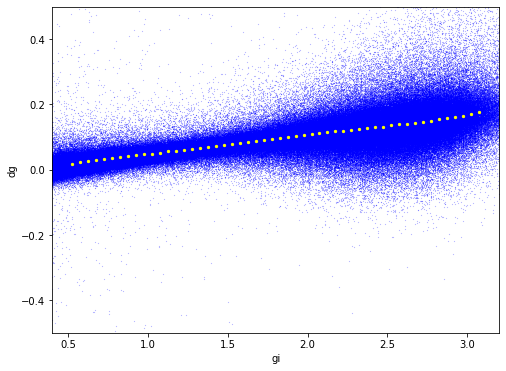

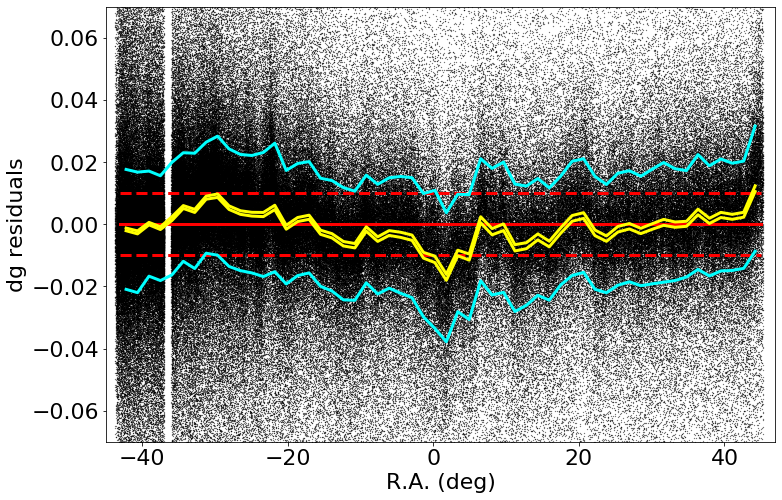

made plot colorResidDES2_dg_RA.png
medianAll: -2.4257199999773438e-05 std.dev.All: 0.019824329143126176
N= 552530 min= -0.29998893240000263 max= 0.2999772619999985
median: -0.0009356545500017951 std.dev: 0.00518323716331516
saved plot as: colorResidDES2_dg_RA_Hess.png


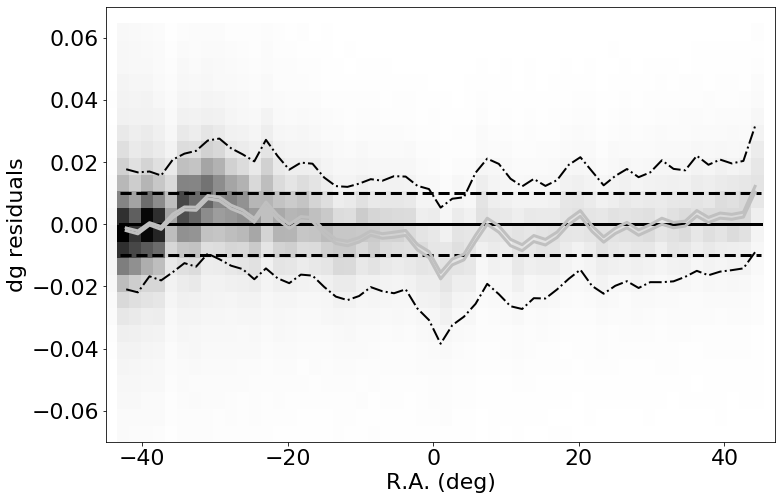

made plot colorResidDES2_dg_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -2.4257199999773438e-05 std.dev.All: 0.019824329143126176
N= 552530 min= -0.29998893240000263 max= 0.2999772619999985
median: 0.00040838150000096704 std.dev: 0.0019543135522523034
saved plot as: colorResidDES2_dg_Dec.png


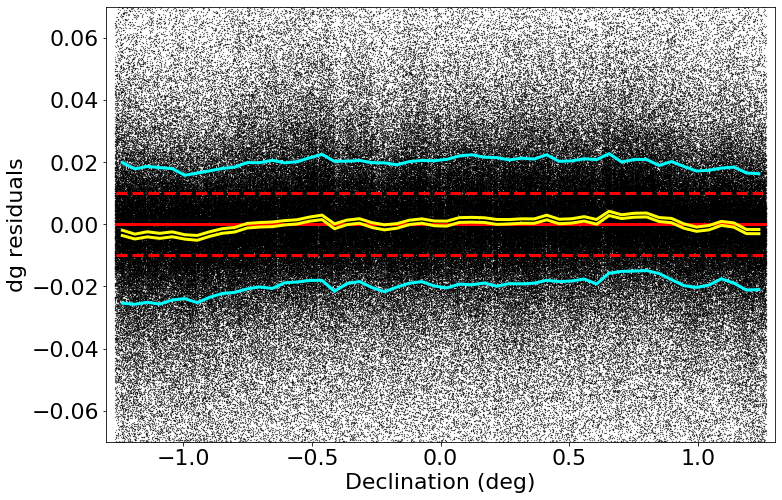

made plot colorResidDES2_dg_Dec.png
medianAll: -2.4257199999773438e-05 std.dev.All: 0.019824329143126176
N= 552530 min= -0.29998893240000263 max= 0.2999772619999985
median: 0.00039998310000267934 std.dev: 0.001976116041290524
saved plot as: colorResidDES2_dg_Dec_Hess.png


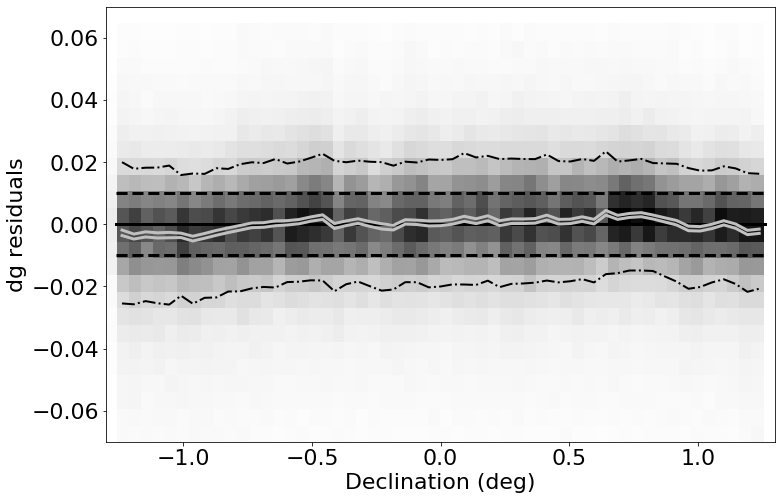

made plot colorResidDES2_dg_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -2.4257199999773438e-05 std.dev.All: 0.019824329143126176
N= 552530 min= -0.29998893240000263 max= 0.2999772619999985
median: 0.0015163856000001662 std.dev: 0.006859708713315604
saved plot as: colorResidDES2_dg_rmag.png


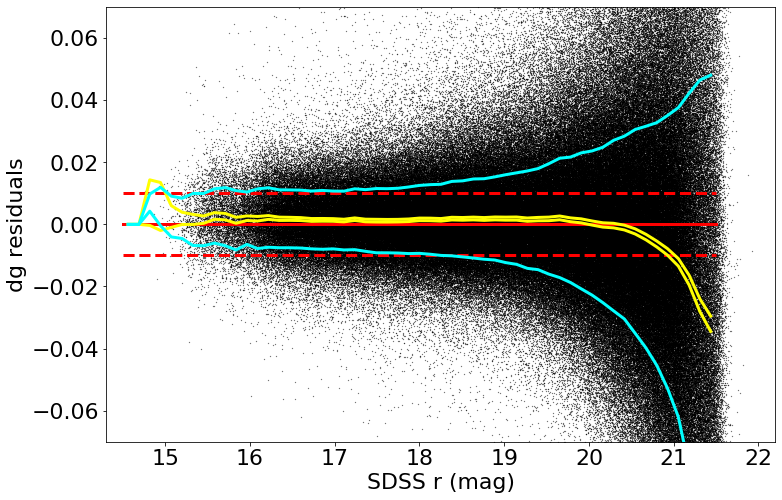

made plot colorResidDES2_dg_rmag.png
medianAll: -2.4257199999773438e-05 std.dev.All: 0.019824329143126176
N= 552530 min= -0.29998893240000263 max= 0.2999772619999985
median: 0.0015163856000001662 std.dev: 0.006859708713315604
saved plot as: colorResidDES2_dg_rmag_Hess.png


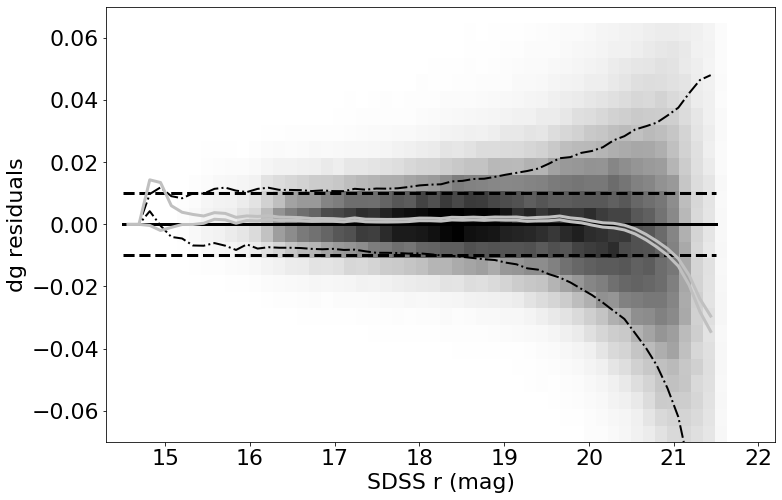

made plot colorResidDES2_dg_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: -9.822299998803186e-06 std.dev.All: 0.014240638868626924
N= 553176 min= -0.29800576959999925 max= 0.2971873032000004
median: -0.001218132450001158 std.dev: 0.00425060325153848
saved plot as: colorResidDES2_dr_RA.png


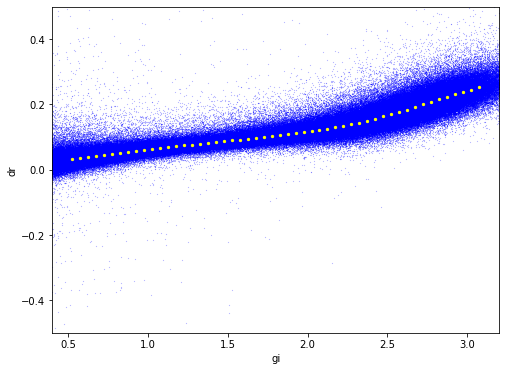

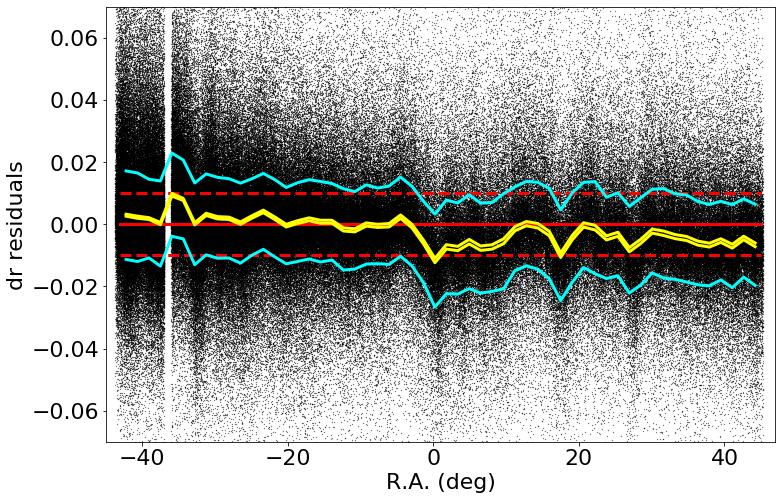

made plot colorResidDES2_dr_RA.png
medianAll: -9.822299998803186e-06 std.dev.All: 0.014240638868626924
N= 553176 min= -0.29800576959999925 max= 0.2971873032000004
median: -0.0014039068000015476 std.dev: 0.004263131421336083
saved plot as: colorResidDES2_dr_RA_Hess.png


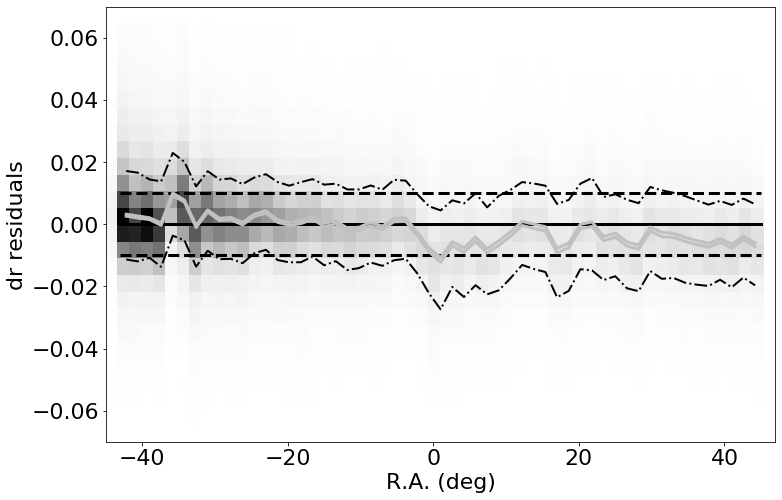

made plot colorResidDES2_dr_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -9.822299998803186e-06 std.dev.All: 0.014240638868626924
N= 553176 min= -0.29800576959999925 max= 0.2971873032000004
median: -0.00022071055000106796 std.dev: 0.0009965617660149908
saved plot as: colorResidDES2_dr_Dec.png


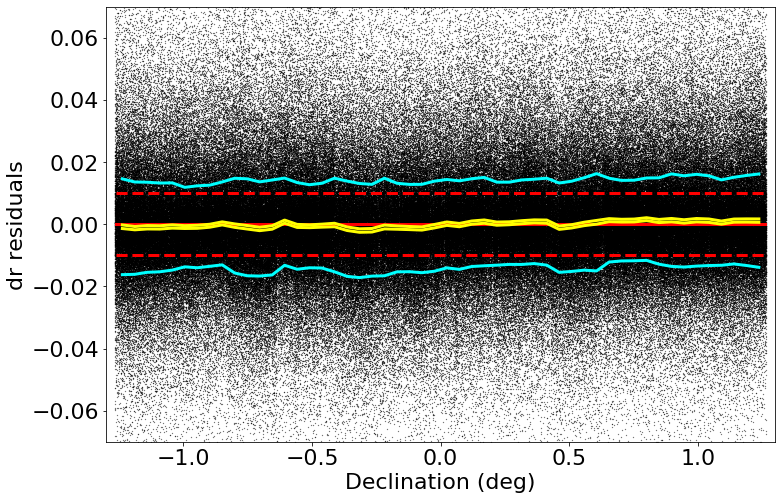

made plot colorResidDES2_dr_Dec.png
medianAll: -9.822299998803186e-06 std.dev.All: 0.014240638868626924
N= 553176 min= -0.29800576959999925 max= 0.2971873032000004
median: -0.0001582498999987171 std.dev: 0.0010012918503789253
saved plot as: colorResidDES2_dr_Dec_Hess.png


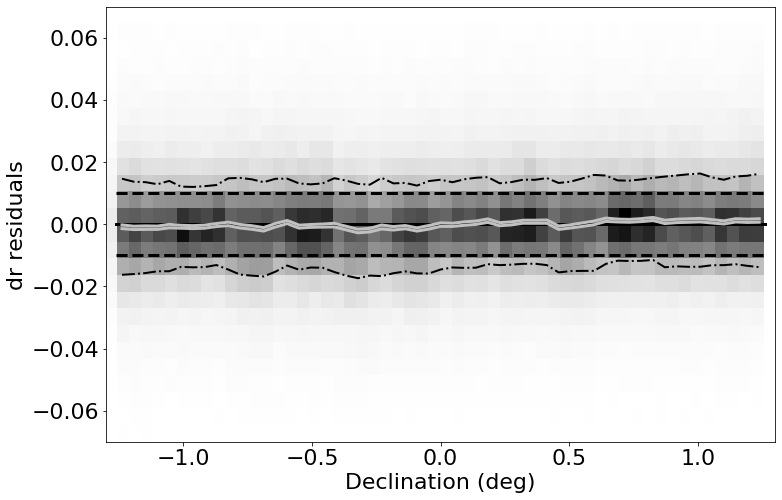

made plot colorResidDES2_dr_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -9.822299998803186e-06 std.dev.All: 0.014240638868626924
N= 553176 min= -0.29800576959999925 max= 0.2971873032000004
median: -0.0010659959499998567 std.dev: 0.0027536502366853365
saved plot as: colorResidDES2_dr_rmag.png


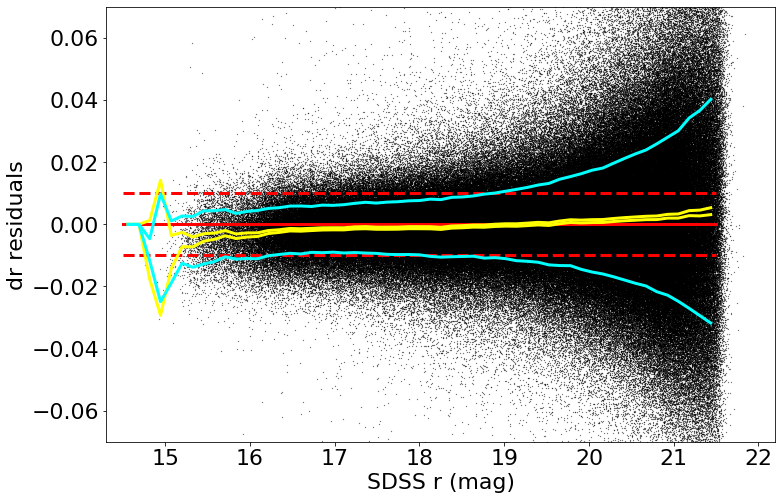

made plot colorResidDES2_dr_rmag.png
medianAll: -9.822299998803186e-06 std.dev.All: 0.014240638868626924
N= 553176 min= -0.29800576959999925 max= 0.2971873032000004
median: -0.0010659959499998567 std.dev: 0.0027536502366853365
saved plot as: colorResidDES2_dr_rmag_Hess.png


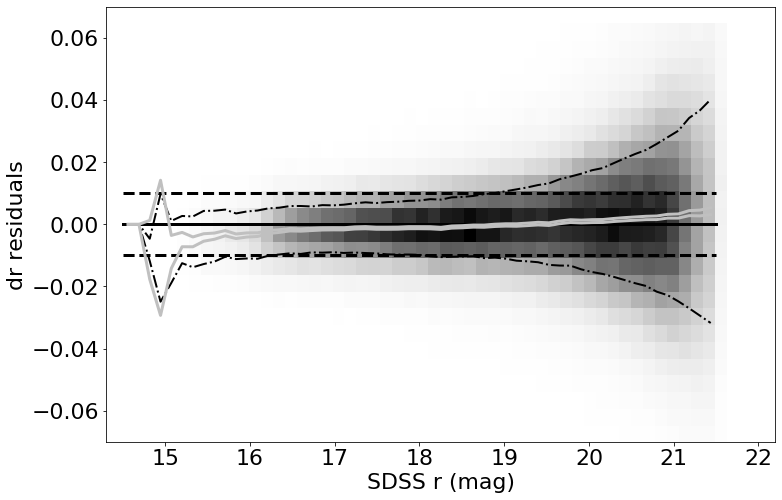

made plot colorResidDES2_dr_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: -1.4178250000732029e-05 std.dev.All: 0.01566203075579878
N= 553198 min= -0.29979726939999957 max= 0.29880564160000295
median: -0.007280430599998628 std.dev: 0.00724343234758345
saved plot as: colorResidDES2_di_RA.png


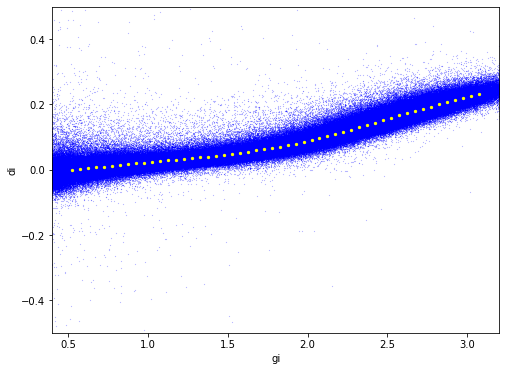

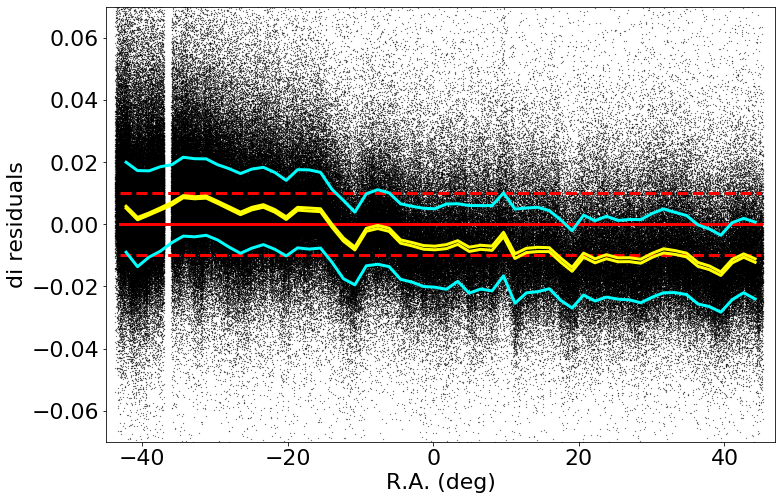

made plot colorResidDES2_di_RA.png
medianAll: -1.4178250000732029e-05 std.dev.All: 0.01566203075579878
N= 553198 min= -0.29979726939999957 max= 0.29880564160000295
median: -0.006752534449998241 std.dev: 0.0072069933952362735
saved plot as: colorResidDES2_di_RA_Hess.png


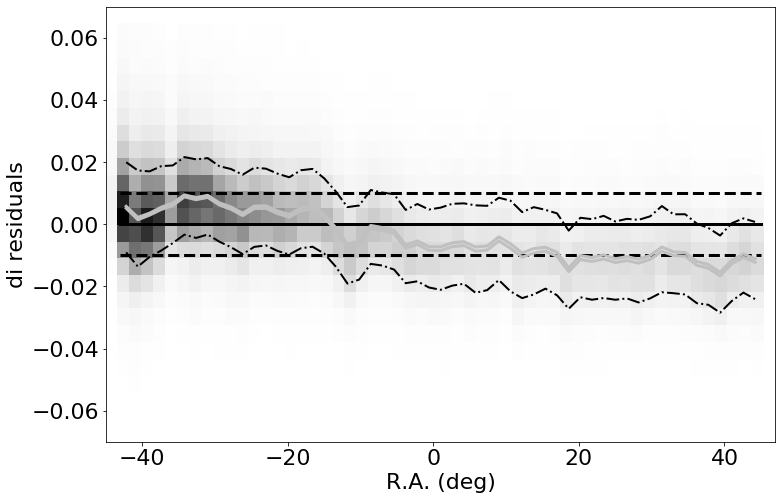

made plot colorResidDES2_di_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -1.4178250000732029e-05 std.dev.All: 0.01566203075579878
N= 553198 min= -0.29979726939999957 max= 0.29880564160000295
median: 0.0004542723500005673 std.dev: 0.002104106634564345
saved plot as: colorResidDES2_di_Dec.png


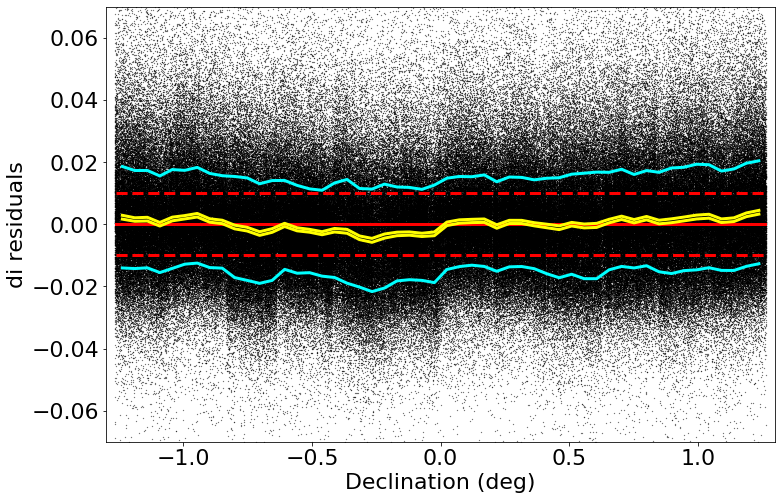

made plot colorResidDES2_di_Dec.png
medianAll: -1.4178250000732029e-05 std.dev.All: 0.01566203075579878
N= 553198 min= -0.29979726939999957 max= 0.29880564160000295
median: 0.00014257220000256365 std.dev: 0.0021101685043594175
saved plot as: colorResidDES2_di_Dec_Hess.png


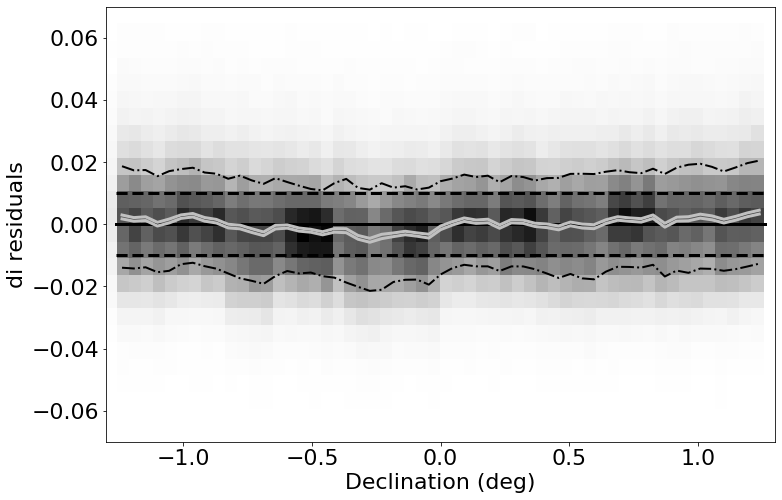

made plot colorResidDES2_di_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.4178250000732029e-05 std.dev.All: 0.01566203075579878
N= 553198 min= -0.29979726939999957 max= 0.29880564160000295
median: -0.001645399999997417 std.dev: 0.004236505661841618
saved plot as: colorResidDES2_di_rmag.png


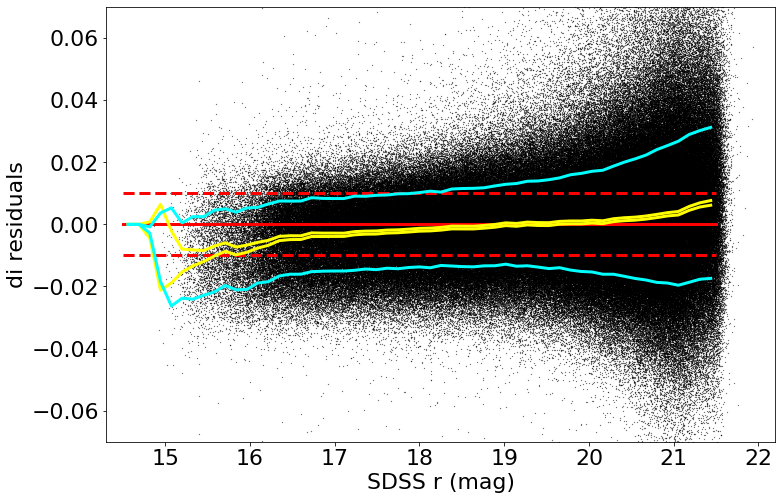

made plot colorResidDES2_di_rmag.png
medianAll: -1.4178250000732029e-05 std.dev.All: 0.01566203075579878
N= 553198 min= -0.29979726939999957 max= 0.29880564160000295
median: -0.001645399999997417 std.dev: 0.004236505661841618
saved plot as: colorResidDES2_di_rmag_Hess.png


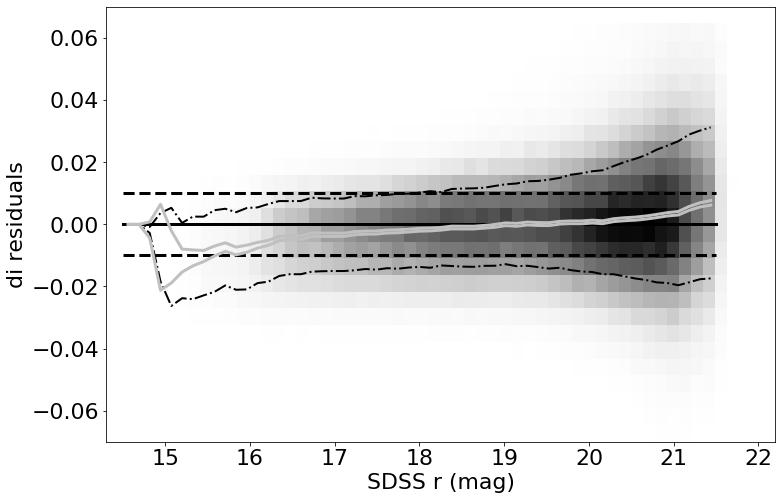

made plot colorResidDES2_di_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: -1.1958000000527637e-05 std.dev.All: 0.0248489368071743
N= 552940 min= -0.2986723197000028 max= 0.299565839499999
median: -0.003674775874998341 std.dev: 0.013945877051218806
saved plot as: colorResidDES2_dz_RA.png


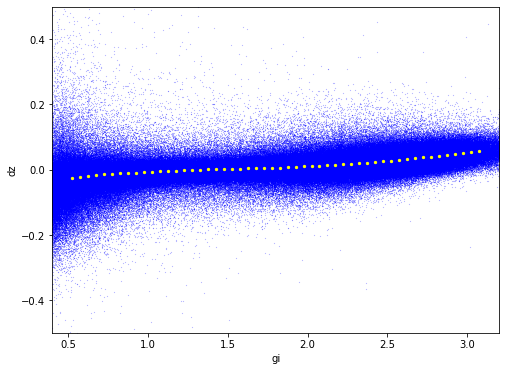

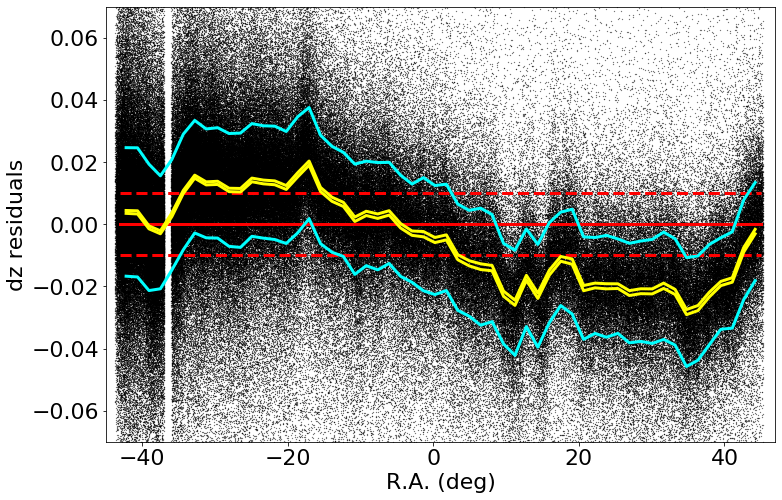

made plot colorResidDES2_dz_RA.png
medianAll: -1.1958000000527637e-05 std.dev.All: 0.0248489368071743
N= 552940 min= -0.2986723197000028 max= 0.299565839499999
median: -0.0035787991999983552 std.dev: 0.013927009941040003
saved plot as: colorResidDES2_dz_RA_Hess.png


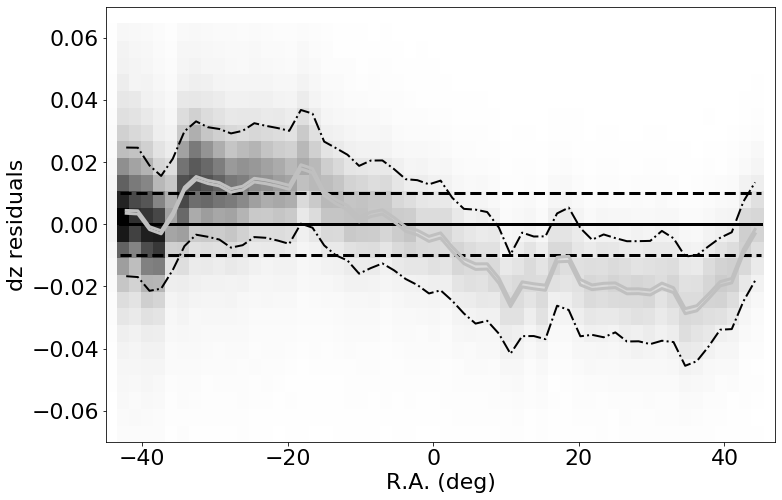

made plot colorResidDES2_dz_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -1.1958000000527637e-05 std.dev.All: 0.0248489368071743
N= 552940 min= -0.2986723197000028 max= 0.299565839499999
median: 0.0009951267000004645 std.dev: 0.00488756114227778
saved plot as: colorResidDES2_dz_Dec.png


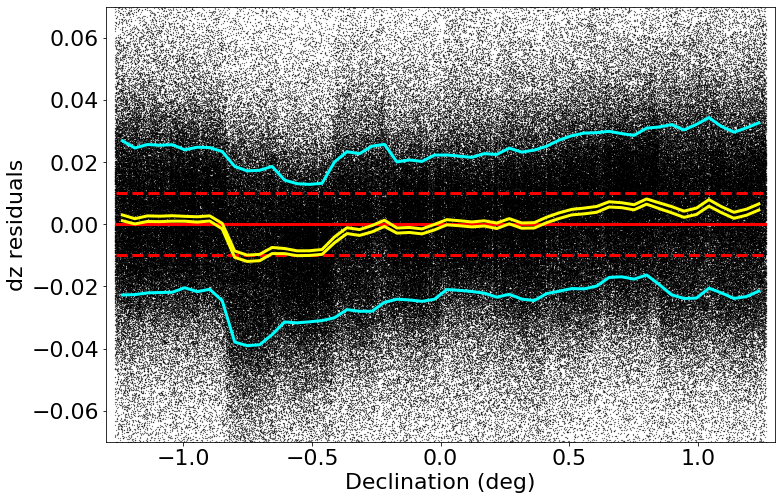

made plot colorResidDES2_dz_Dec.png
medianAll: -1.1958000000527637e-05 std.dev.All: 0.0248489368071743
N= 552940 min= -0.2986723197000028 max= 0.299565839499999
median: 0.00108437809999826 std.dev: 0.0048870673794935695
saved plot as: colorResidDES2_dz_Dec_Hess.png


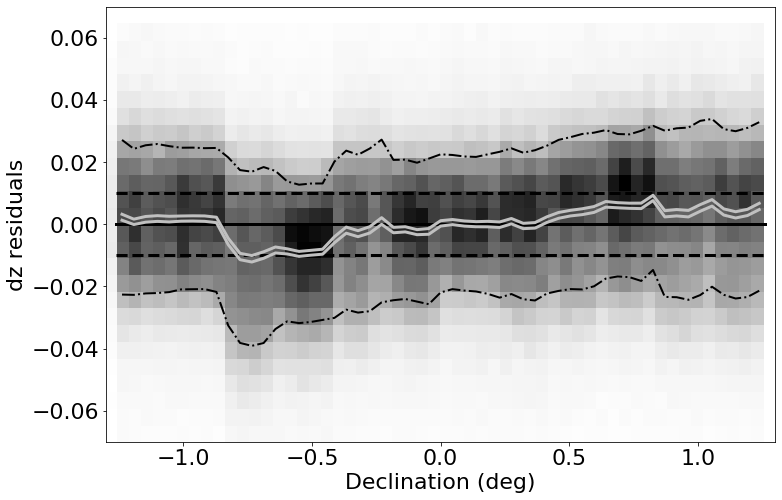

made plot colorResidDES2_dz_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.1958000000527637e-05 std.dev.All: 0.0248489368071743
N= 552940 min= -0.2986723197000028 max= 0.299565839499999
median: 0.001249854600000582 std.dev: 0.004238113068017867
saved plot as: colorResidDES2_dz_rmag.png


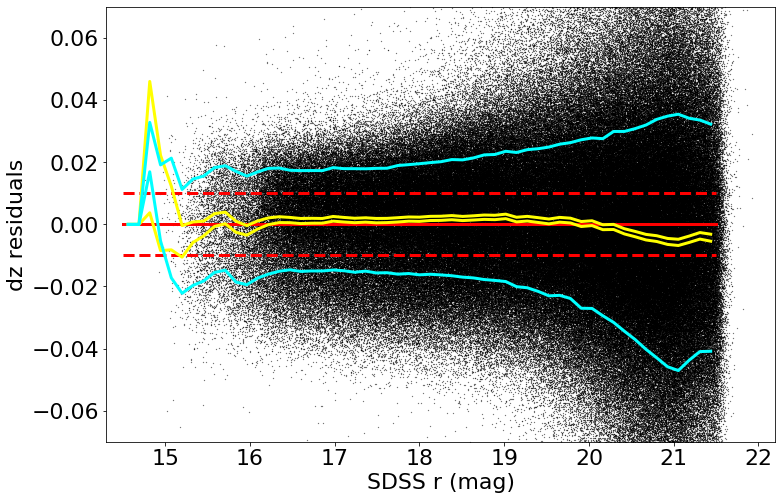

made plot colorResidDES2_dz_rmag.png
medianAll: -1.1958000000527637e-05 std.dev.All: 0.0248489368071743
N= 552940 min= -0.2986723197000028 max= 0.299565839499999
median: 0.001249854600000582 std.dev: 0.004238113068017867
saved plot as: colorResidDES2_dz_rmag_Hess.png


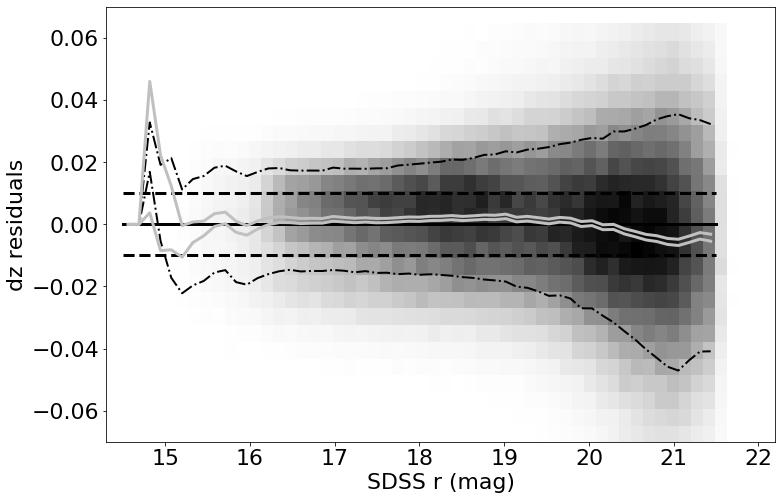

made plot colorResidDES2_dz_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dgr ===================
 stats for RA binning medians:
medianAll: -5.595800003137252e-06 std.dev.All: 0.023005494624452248
N= 552871 min= -0.2999560430000012 max= 0.2997148749999993
median: 0.0003514958249970766 std.dev: 0.005335424382950678
saved plot as: colorResidDES2_dgr_RA.png


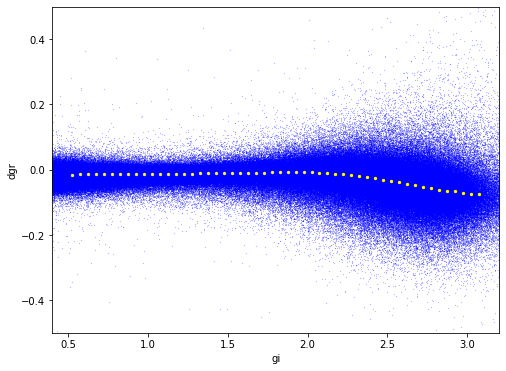

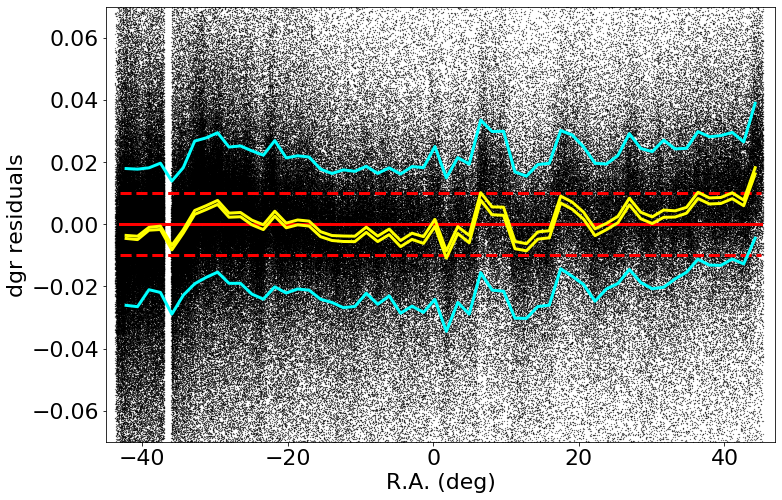

made plot colorResidDES2_dgr_RA.png
medianAll: -5.595800003137252e-06 std.dev.All: 0.023005494624452248
N= 552871 min= -0.2999560430000012 max= 0.2997148749999993
median: -0.0006692383000018757 std.dev: 0.005137181122485978
saved plot as: colorResidDES2_dgr_RA_Hess.png


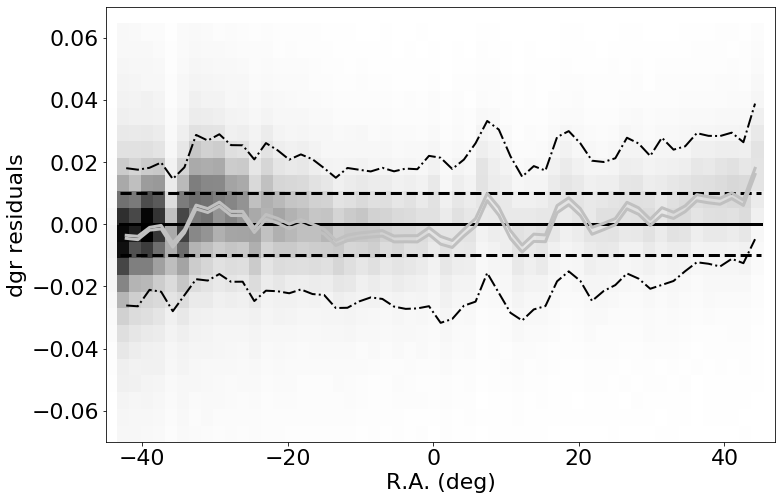

made plot colorResidDES2_dgr_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -5.595800003137252e-06 std.dev.All: 0.023005494624452248
N= 552871 min= -0.2999560430000012 max= 0.2997148749999993
median: 0.00047596414999846303 std.dev: 0.0019398638346021806
saved plot as: colorResidDES2_dgr_Dec.png


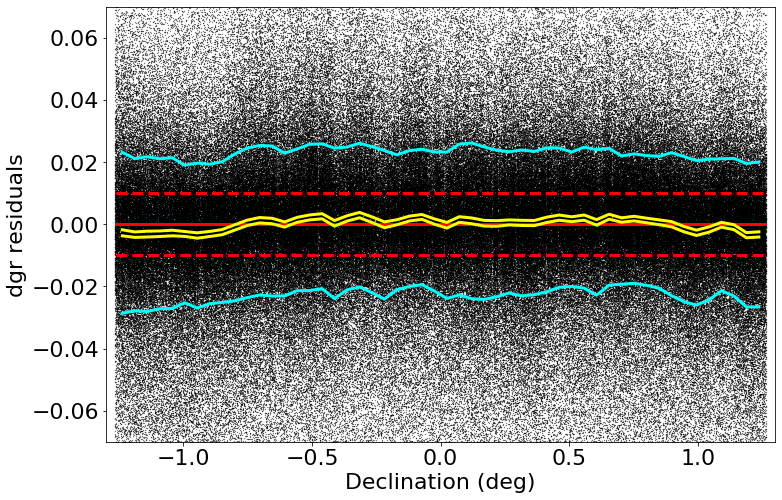

made plot colorResidDES2_dgr_Dec.png
medianAll: -5.595800003137252e-06 std.dev.All: 0.023005494624452248
N= 552871 min= -0.2999560430000012 max= 0.2997148749999993
median: 0.0006006867999961991 std.dev: 0.0019374415861506537
saved plot as: colorResidDES2_dgr_Dec_Hess.png


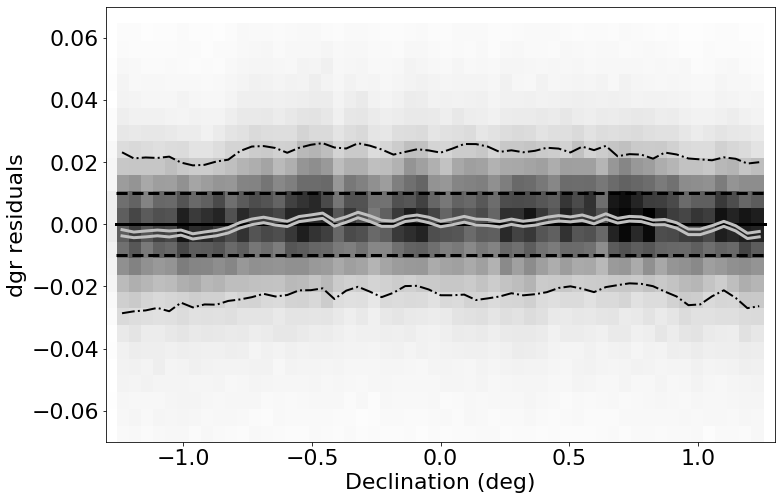

made plot colorResidDES2_dgr_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -5.595800003137252e-06 std.dev.All: 0.023005494624452248
N= 552871 min= -0.2999560430000012 max= 0.2997148749999993
median: 0.002110767549999018 std.dev: 0.008636445641251475
saved plot as: colorResidDES2_dgr_rmag.png


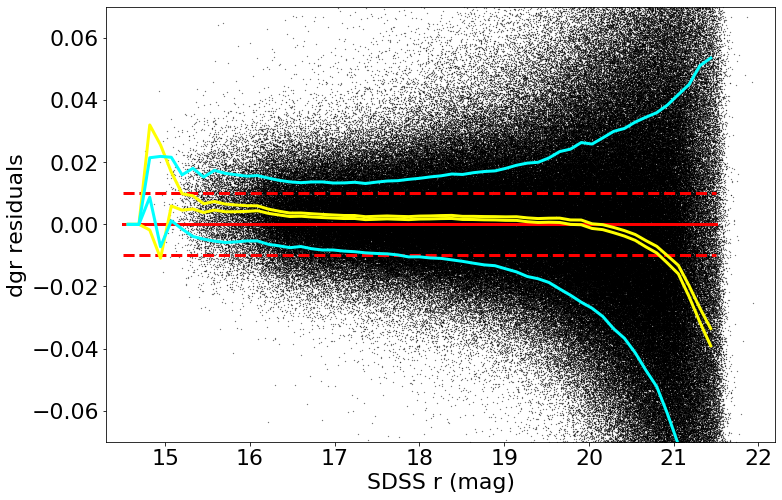

made plot colorResidDES2_dgr_rmag.png
medianAll: -5.595800003137252e-06 std.dev.All: 0.023005494624452248
N= 552871 min= -0.2999560430000012 max= 0.2997148749999993
median: 0.002110767549999018 std.dev: 0.008636445641251475
saved plot as: colorResidDES2_dgr_rmag_Hess.png


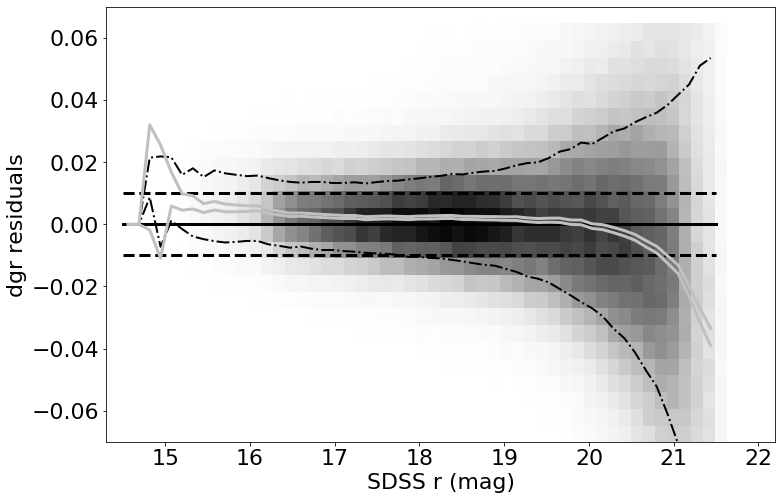

made plot colorResidDES2_dgr_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dri ===================
 stats for RA binning medians:
medianAll: -7.693599995098332e-06 std.dev.All: 0.016176418876798486
N= 553285 min= -0.28826740600000295 max= 0.29677213139999914
median: 0.0016562472500012484 std.dev: 0.005062184568917297
saved plot as: colorResidDES2_dri_RA.png


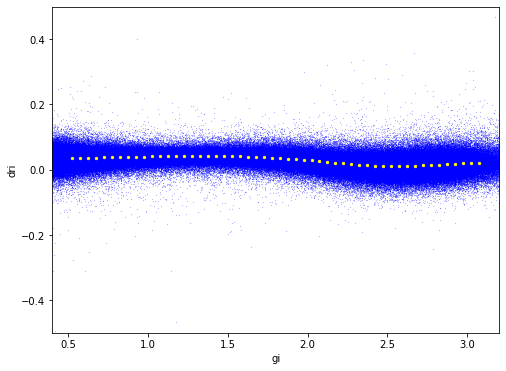

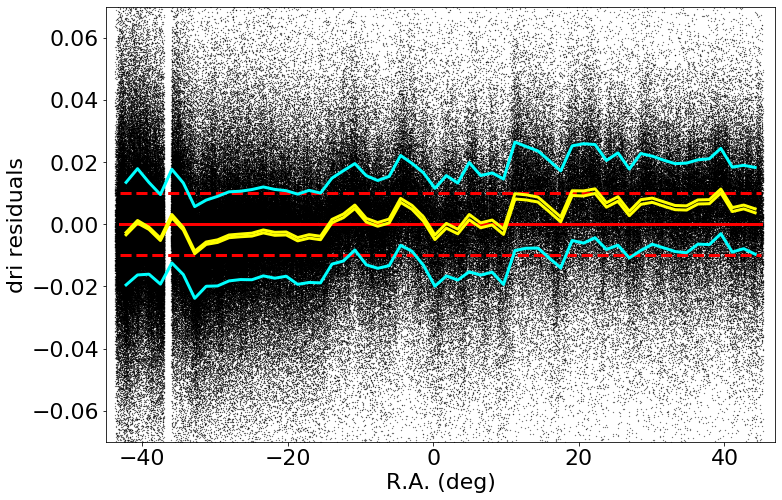

made plot colorResidDES2_dri_RA.png
medianAll: -7.693599995098332e-06 std.dev.All: 0.016176418876798486
N= 553285 min= -0.28826740600000295 max= 0.29677213139999914
median: 0.002838174000002726 std.dev: 0.005025393623161826
saved plot as: colorResidDES2_dri_RA_Hess.png


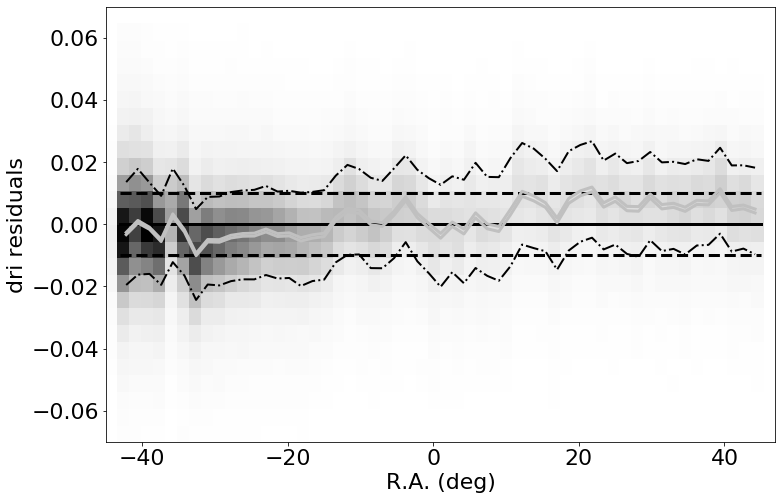

made plot colorResidDES2_dri_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -7.693599995098332e-06 std.dev.All: 0.016176418876798486
N= 553285 min= -0.28826740600000295 max= 0.29677213139999914
median: 0.00027092847500158074 std.dev: 0.0014632800454982848
saved plot as: colorResidDES2_dri_Dec.png


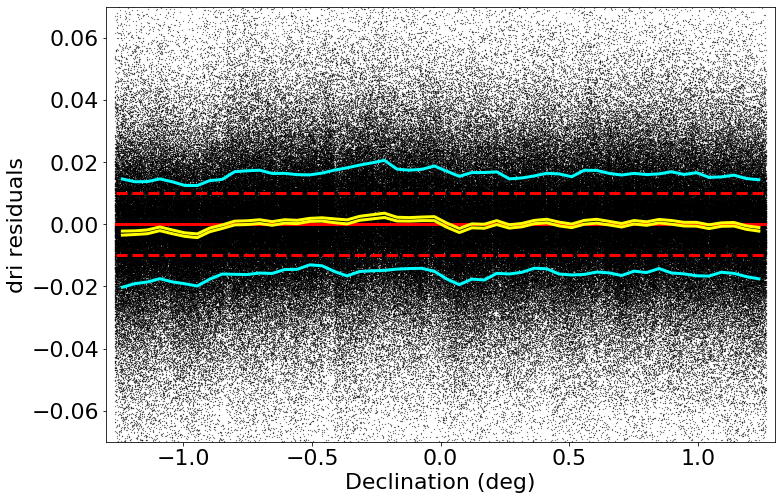

made plot colorResidDES2_dri_Dec.png
medianAll: -7.693599995098332e-06 std.dev.All: 0.016176418876798486
N= 553285 min= -0.28826740600000295 max= 0.29677213139999914
median: 0.00019388830000316264 std.dev: 0.0014771795299883665
saved plot as: colorResidDES2_dri_Dec_Hess.png


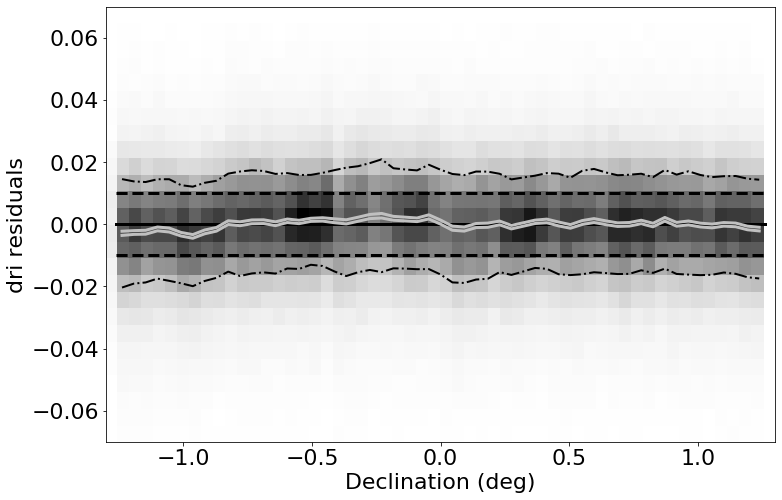

made plot colorResidDES2_dri_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -7.693599995098332e-06 std.dev.All: 0.016176418876798486
N= 553285 min= -0.28826740600000295 max= 0.29677213139999914
median: -0.00014099280000303555 std.dev: 0.0021899028325094586
saved plot as: colorResidDES2_dri_rmag.png


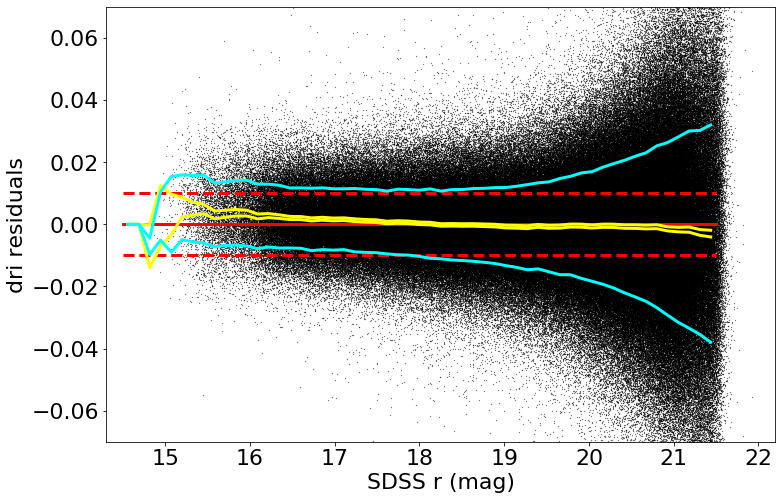

made plot colorResidDES2_dri_rmag.png
medianAll: -7.693599995098332e-06 std.dev.All: 0.016176418876798486
N= 553285 min= -0.28826740600000295 max= 0.29677213139999914
median: -0.00014099280000303555 std.dev: 0.0021899028325094586
saved plot as: colorResidDES2_dri_rmag_Hess.png


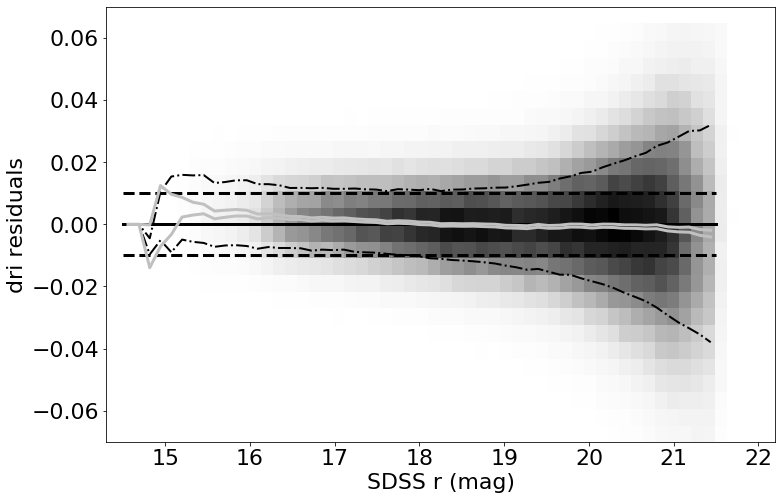

made plot colorResidDES2_dri_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: diz ===================
 stats for RA binning medians:
medianAll: -4.672999975585679e-07 std.dev.All: 0.022103003474173974
N= 553108 min= -0.2997603050999981 max= 0.2981648300000028
median: -0.0004239083999997735 std.dev: 0.008676693843996032
saved plot as: colorResidDES2_diz_RA.png


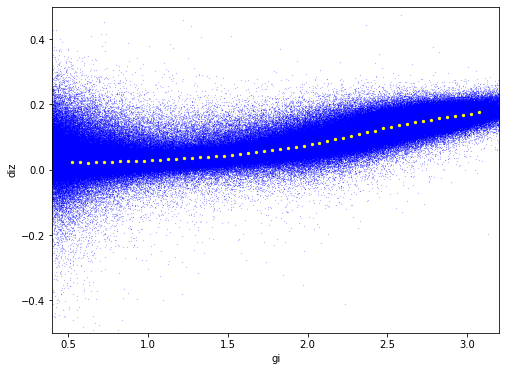

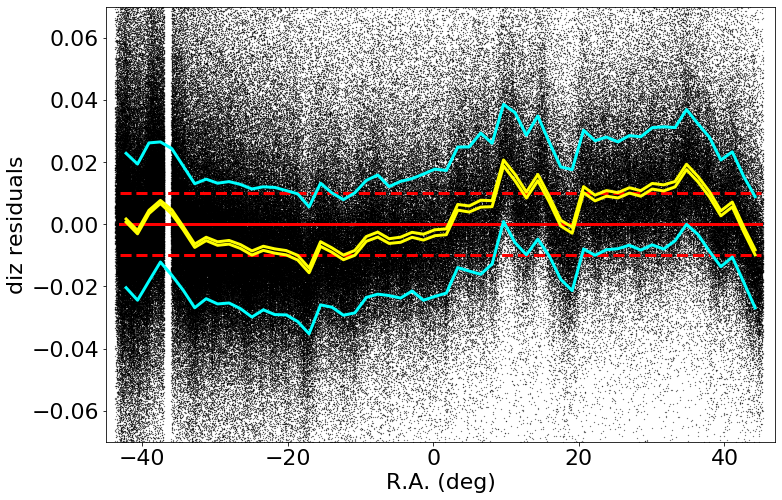

made plot colorResidDES2_diz_RA.png
medianAll: -4.672999975585679e-07 std.dev.All: 0.022103003474173974
N= 553108 min= -0.2997603050999981 max= 0.2981648300000028
median: 0.0012104944999987953 std.dev: 0.008617063767099113
saved plot as: colorResidDES2_diz_RA_Hess.png


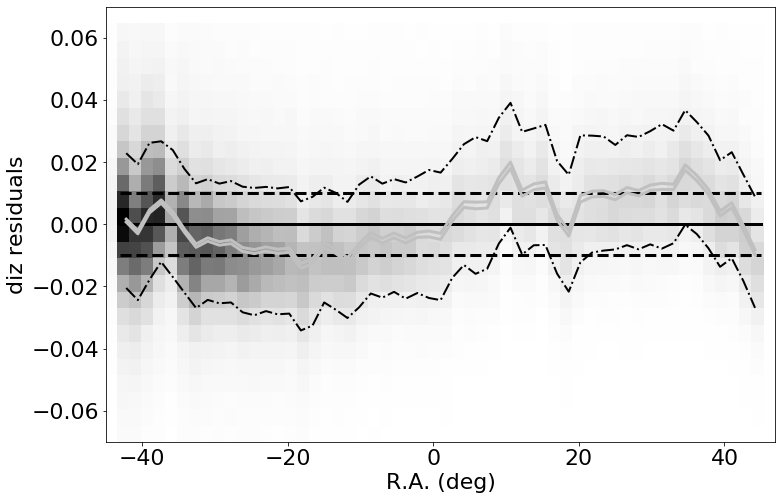

made plot colorResidDES2_diz_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -4.672999975585679e-07 std.dev.All: 0.022103003474173974
N= 553108 min= -0.2997603050999981 max= 0.2981648300000028
median: -0.0005237124500001005 std.dev: 0.0036174420081849473
saved plot as: colorResidDES2_diz_Dec.png


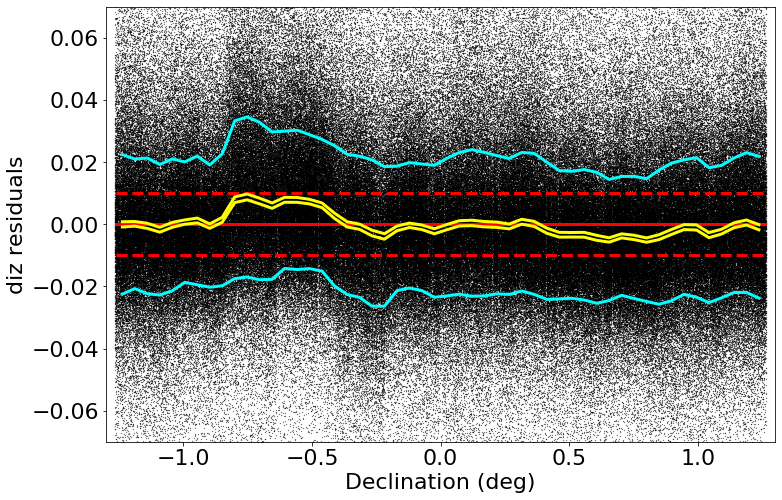

made plot colorResidDES2_diz_Dec.png
medianAll: -4.672999975585679e-07 std.dev.All: 0.022103003474173974
N= 553108 min= -0.2997603050999981 max= 0.2981648300000028
median: -0.0004314423999980249 std.dev: 0.0036323192990055757
saved plot as: colorResidDES2_diz_Dec_Hess.png


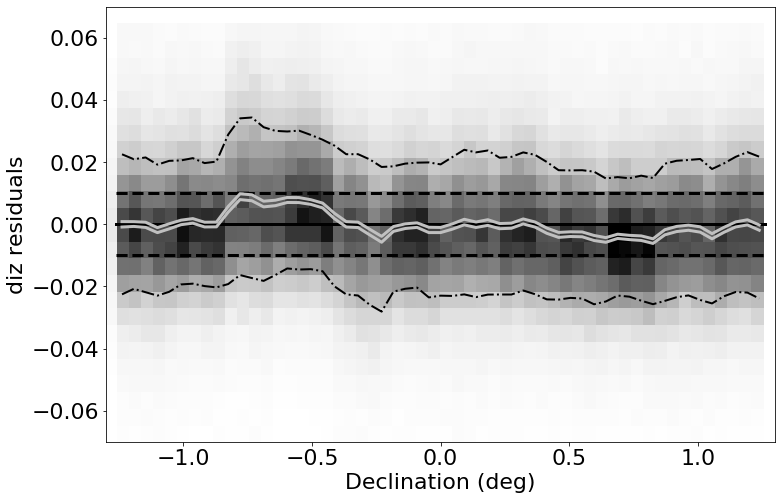

made plot colorResidDES2_diz_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -4.672999975585679e-07 std.dev.All: 0.022103003474173974
N= 553108 min= -0.2997603050999981 max= 0.2981648300000028
median: -0.0023778563000026853 std.dev: 0.0063056441621135466
saved plot as: colorResidDES2_diz_rmag.png


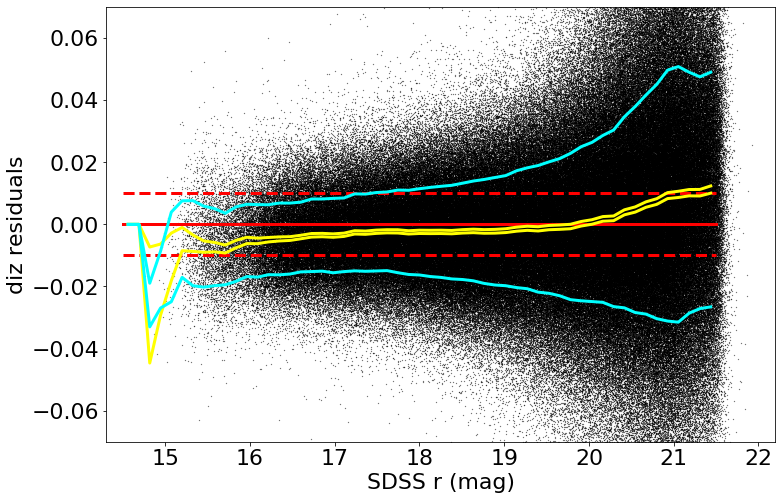

made plot colorResidDES2_diz_rmag.png
medianAll: -4.672999975585679e-07 std.dev.All: 0.022103003474173974
N= 553108 min= -0.2997603050999981 max= 0.2981648300000028
median: -0.0023778563000026853 std.dev: 0.0063056441621135466
saved plot as: colorResidDES2_diz_rmag_Hess.png


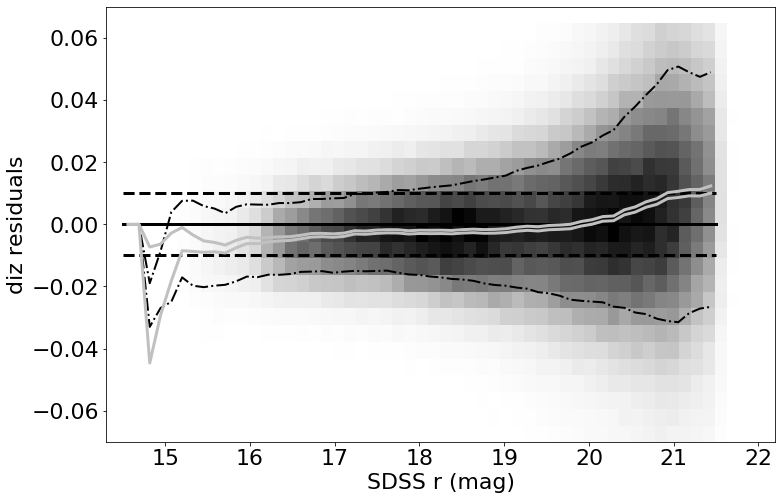

made plot colorResidDES2_diz_rmag_Hess.png
------------------------------------------------------------------


In [13]:
keywords = {"Xstr":'gi', "plotNameRoot":'colorResidDES2_', "symbSize":0.05}
for color in ('dg', 'dr', 'di', 'dz', 'dgr', 'dri', 'diz'):
    keywords["Ystr"] = color 
    doOneColor(sdssDES, keywords)

=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: -1.2229199998436968e-05 std.dev.All: 0.012548863898997984
N= 302957 min= -0.28356481839999825 max= 0.2979937088000036
median: -0.0009883361000011283 std.dev: 0.005155470130057909
saved plot as: colorResidDES2bright_dg_RA.png


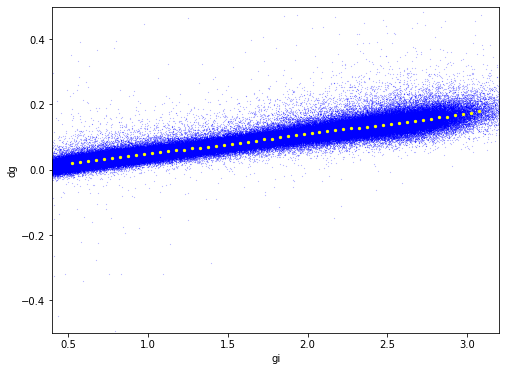

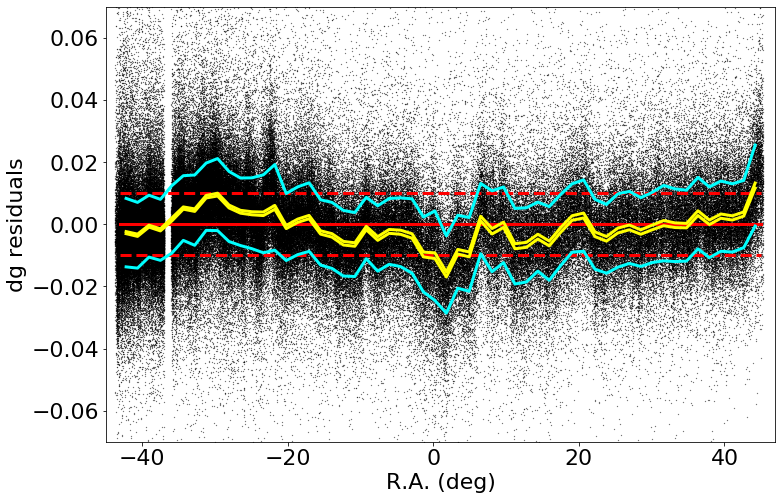

made plot colorResidDES2bright_dg_RA.png
medianAll: -1.2229199998436968e-05 std.dev.All: 0.012548863898997984
N= 302957 min= -0.28356481839999825 max= 0.2979937088000036
median: -0.001000733999996506 std.dev: 0.005098663026736334
saved plot as: colorResidDES2bright_dg_RA_Hess.png


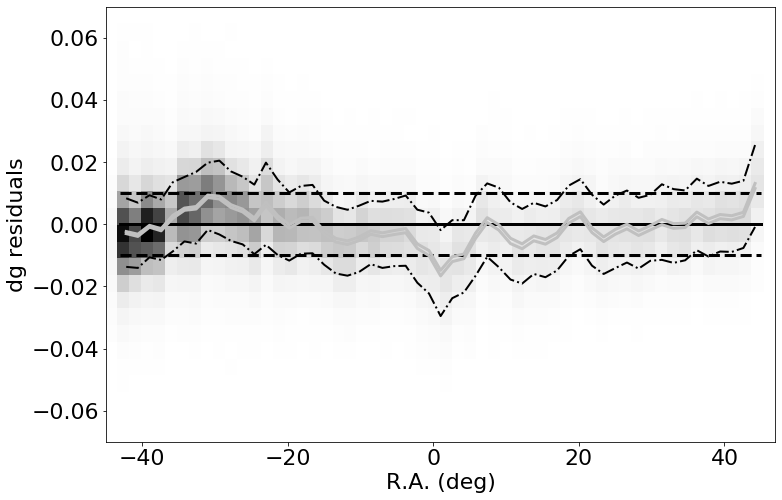

made plot colorResidDES2bright_dg_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -1.2229199998436968e-05 std.dev.All: 0.012548863898997984
N= 302957 min= -0.28356481839999825 max= 0.2979937088000036
median: 9.464299999989521e-05 std.dev: 0.0017602661184450907
saved plot as: colorResidDES2bright_dg_Dec.png


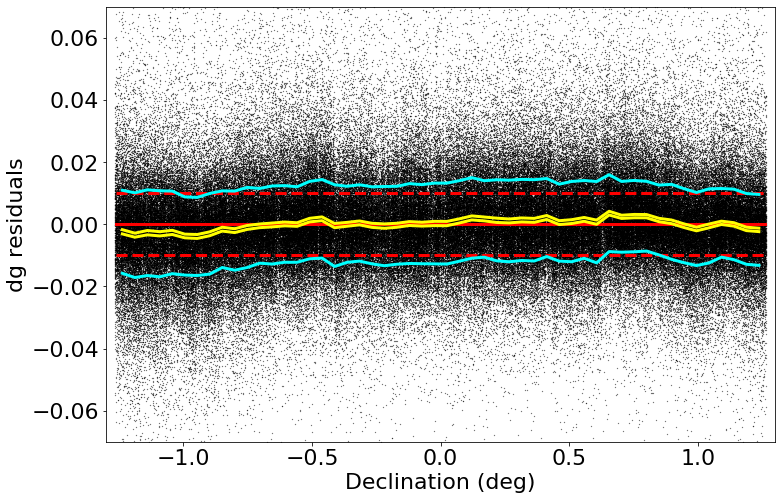

made plot colorResidDES2bright_dg_Dec.png
medianAll: -1.2229199998436968e-05 std.dev.All: 0.012548863898997984
N= 302957 min= -0.28356481839999825 max= 0.2979937088000036
median: 2.7579000000563583e-05 std.dev: 0.0017802943914225291
saved plot as: colorResidDES2bright_dg_Dec_Hess.png


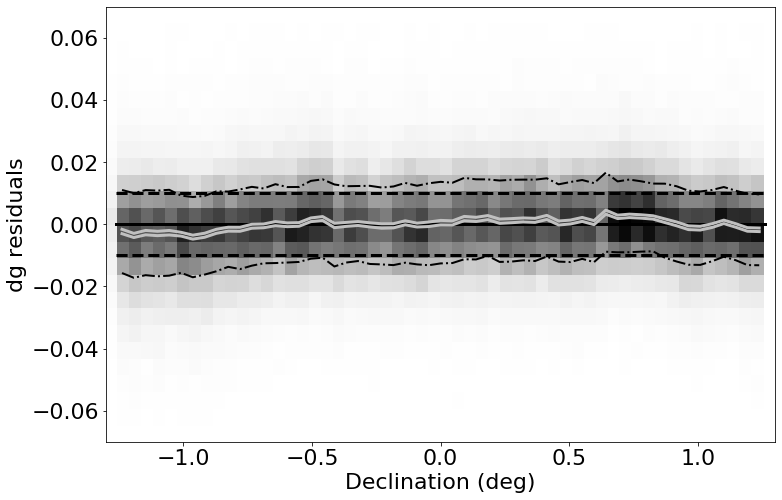

made plot colorResidDES2bright_dg_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.2229199998436968e-05 std.dev.All: 0.012548863898997984
N= 302957 min= -0.28356481839999825 max= 0.2979937088000036
median: 4.0718649999217996e-05 std.dev: 0.001393634789676513
saved plot as: colorResidDES2bright_dg_rmag.png


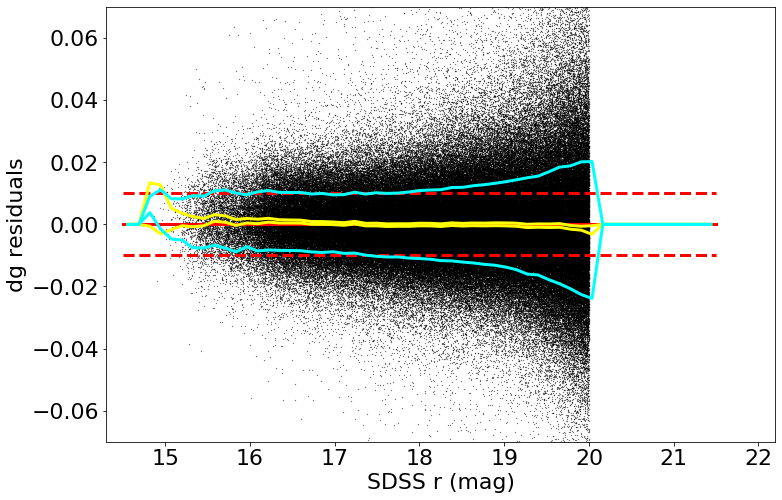

made plot colorResidDES2bright_dg_rmag.png
medianAll: -1.2229199998436968e-05 std.dev.All: 0.012548863898997984
N= 302957 min= -0.28356481839999825 max= 0.2979937088000036
median: 4.0718649999217996e-05 std.dev: 0.001393634789676513
saved plot as: colorResidDES2bright_dg_rmag_Hess.png


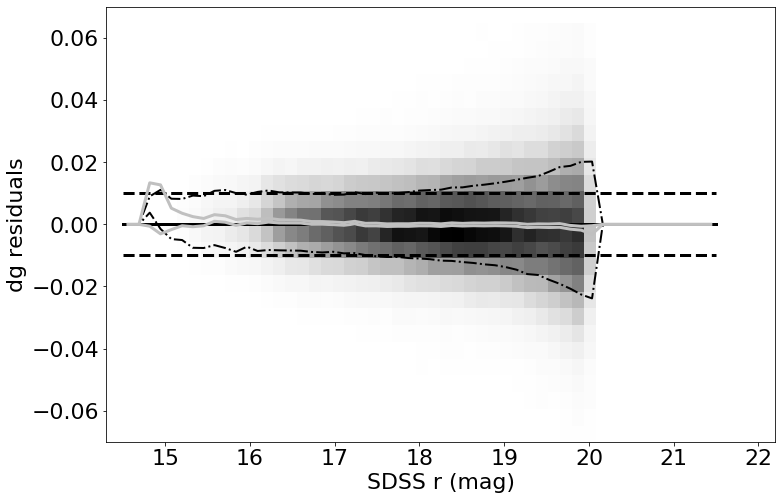

made plot colorResidDES2bright_dg_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: -1.2688550000635596e-05 std.dev.All: 0.01000443762434885
N= 302990 min= -0.29784100349999887 max= 0.29485347870000045
median: -0.0012477031500001227 std.dev: 0.004084457283740359
saved plot as: colorResidDES2bright_dr_RA.png


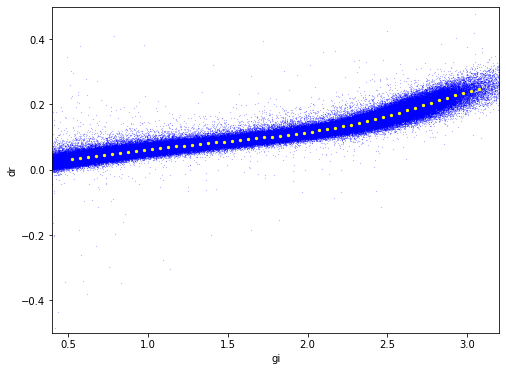

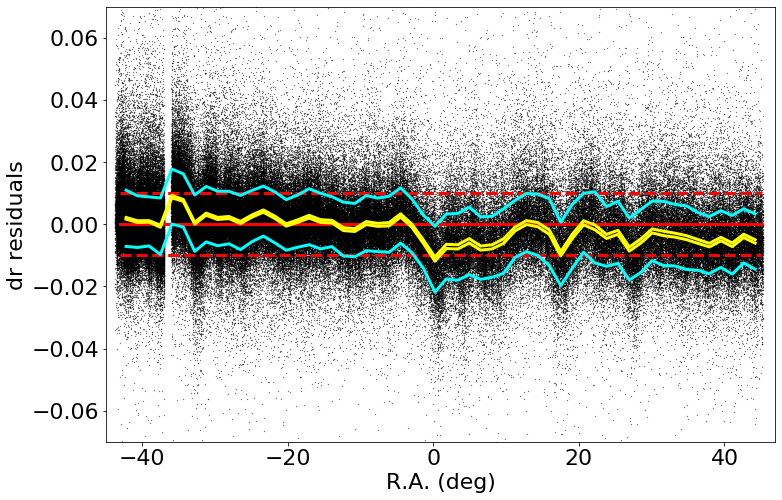

made plot colorResidDES2bright_dr_RA.png
medianAll: -1.2688550000635596e-05 std.dev.All: 0.01000443762434885
N= 302990 min= -0.29784100349999887 max= 0.29485347870000045
median: -0.0009051080000030964 std.dev: 0.004090386397339568
saved plot as: colorResidDES2bright_dr_RA_Hess.png


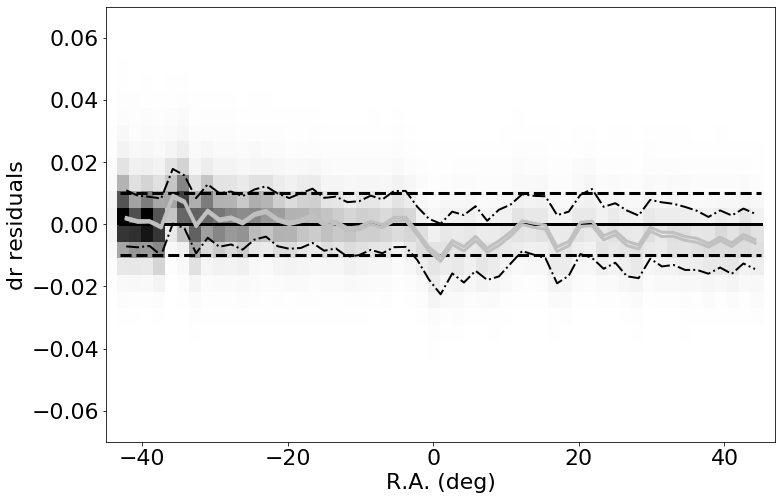

made plot colorResidDES2bright_dr_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -1.2688550000635596e-05 std.dev.All: 0.01000443762434885
N= 302990 min= -0.29784100349999887 max= 0.29485347870000045
median: 1.982149999965946e-05 std.dev: 0.0007704716686613294
saved plot as: colorResidDES2bright_dr_Dec.png


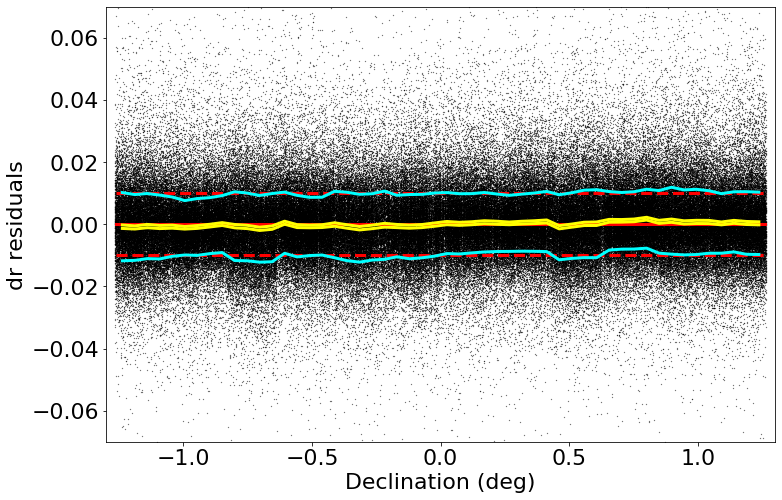

made plot colorResidDES2bright_dr_Dec.png
medianAll: -1.2688550000635596e-05 std.dev.All: 0.01000443762434885
N= 302990 min= -0.29784100349999887 max= 0.29485347870000045
median: -7.703999999883471e-05 std.dev: 0.0007667388678420279
saved plot as: colorResidDES2bright_dr_Dec_Hess.png


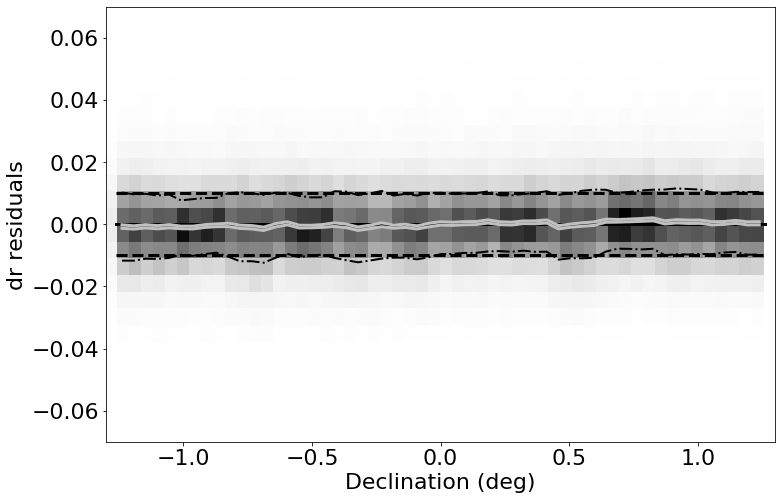

made plot colorResidDES2bright_dr_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.2688550000635596e-05 std.dev.All: 0.01000443762434885
N= 302990 min= -0.29784100349999887 max= 0.29485347870000045
median: -0.0005504355500004967 std.dev: 0.0025870777576944334
saved plot as: colorResidDES2bright_dr_rmag.png


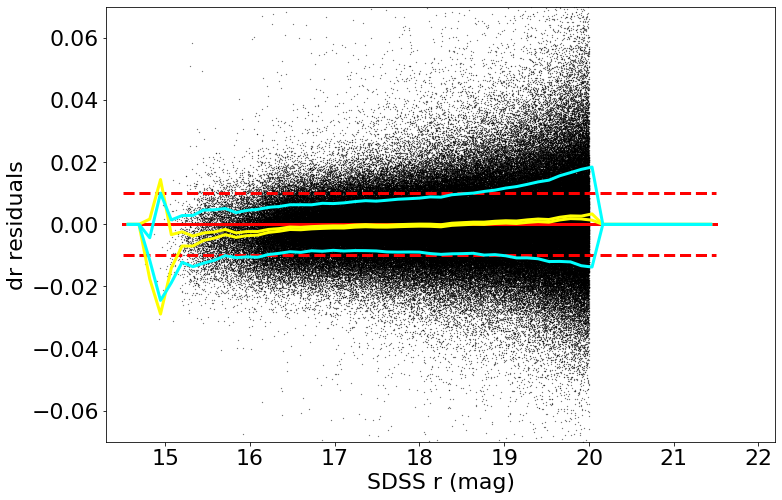

made plot colorResidDES2bright_dr_rmag.png
medianAll: -1.2688550000635596e-05 std.dev.All: 0.01000443762434885
N= 302990 min= -0.29784100349999887 max= 0.29485347870000045
median: -0.0005504355500004967 std.dev: 0.0025870777576944334
saved plot as: colorResidDES2bright_dr_rmag_Hess.png


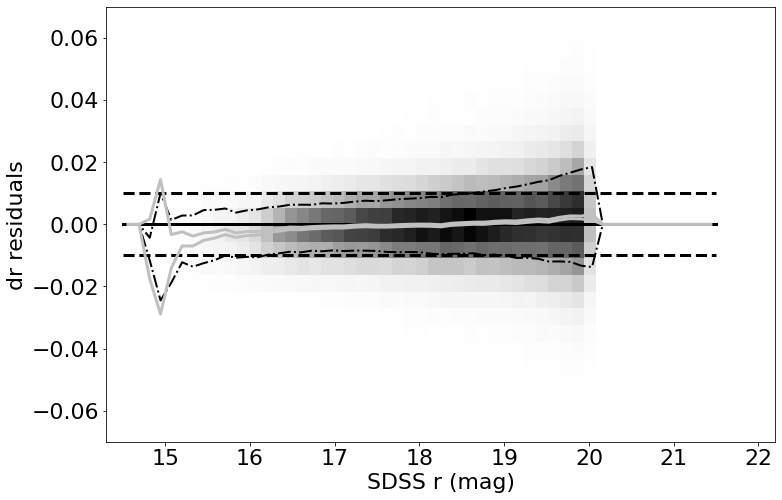

made plot colorResidDES2bright_dr_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: -1.2110399998294108e-05 std.dev.All: 0.012725681911797302
N= 302996 min= -0.29951397479999775 max= 0.2987632620999997
median: -0.007412654499999653 std.dev: 0.007302699450671945
saved plot as: colorResidDES2bright_di_RA.png


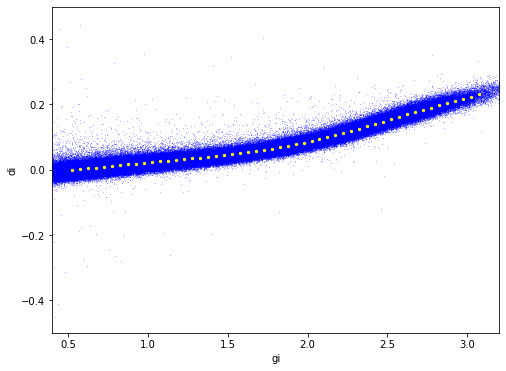

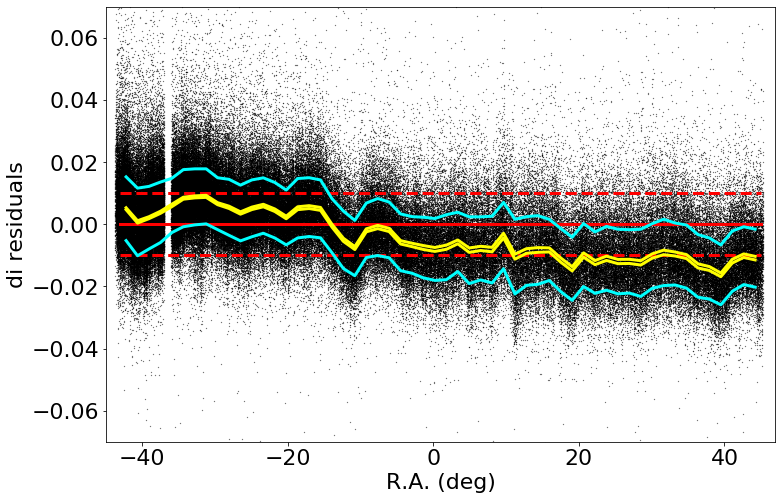

made plot colorResidDES2bright_di_RA.png
medianAll: -1.2110399998294108e-05 std.dev.All: 0.012725681911797302
N= 302996 min= -0.29951397479999775 max= 0.2987632620999997
median: -0.0066847213999995415 std.dev: 0.00726304922738021
saved plot as: colorResidDES2bright_di_RA_Hess.png


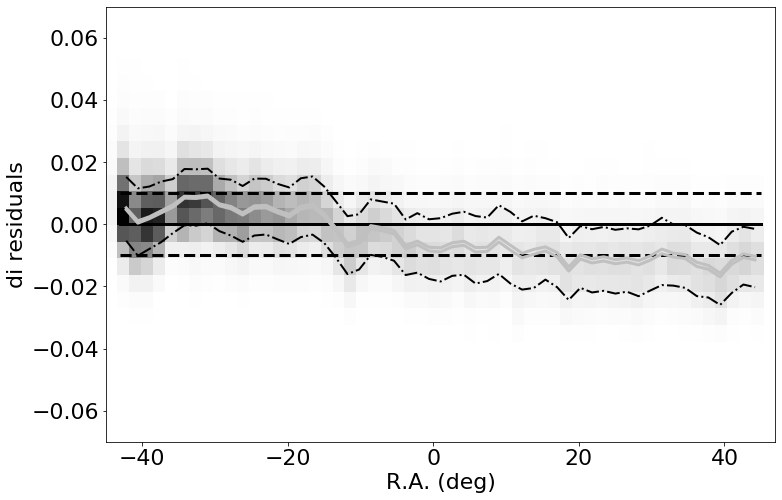

made plot colorResidDES2bright_di_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -1.2110399998294108e-05 std.dev.All: 0.012725681911797302
N= 302996 min= -0.29951397479999775 max= 0.2987632620999997
median: 0.0004759630999986741 std.dev: 0.0015691956677002217
saved plot as: colorResidDES2bright_di_Dec.png


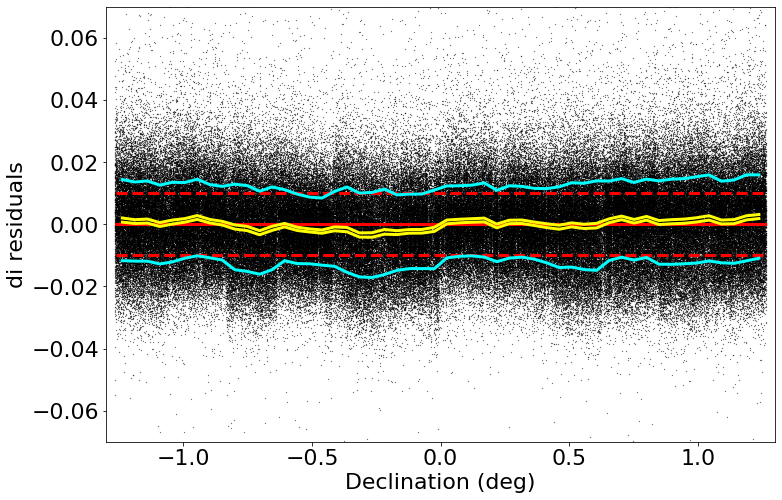

made plot colorResidDES2bright_di_Dec.png
medianAll: -1.2110399998294108e-05 std.dev.All: 0.012725681911797302
N= 302996 min= -0.29951397479999775 max= 0.2987632620999997
median: 5.2672199998500535e-05 std.dev: 0.001611350933707268
saved plot as: colorResidDES2bright_di_Dec_Hess.png


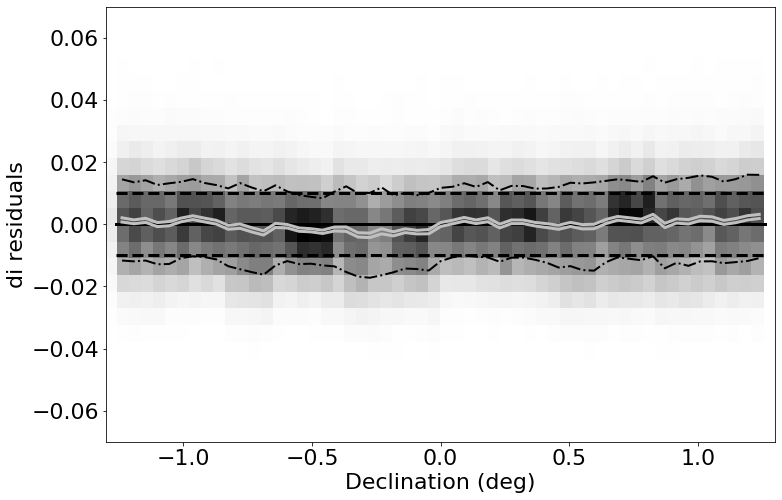

made plot colorResidDES2bright_di_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -1.2110399998294108e-05 std.dev.All: 0.012725681911797302
N= 302996 min= -0.29951397479999775 max= 0.2987632620999997
median: -0.0013772684499998014 std.dev: 0.0041054388485303505
saved plot as: colorResidDES2bright_di_rmag.png


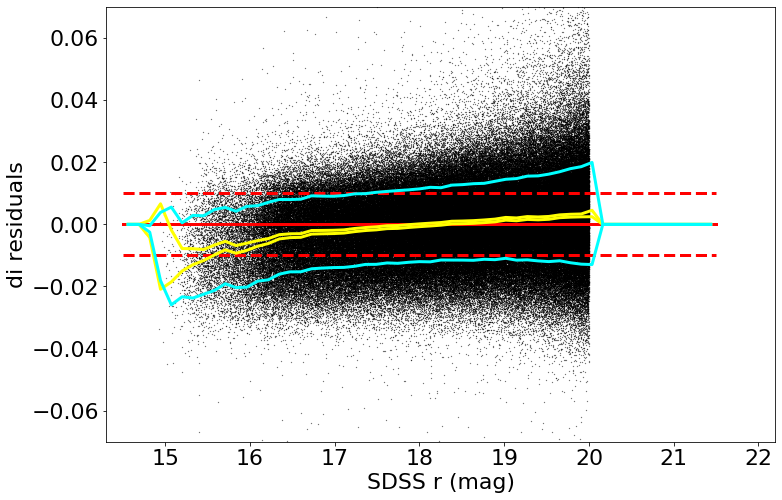

made plot colorResidDES2bright_di_rmag.png
medianAll: -1.2110399998294108e-05 std.dev.All: 0.012725681911797302
N= 302996 min= -0.29951397479999775 max= 0.2987632620999997
median: -0.0013772684499998014 std.dev: 0.0041054388485303505
saved plot as: colorResidDES2bright_di_rmag_Hess.png


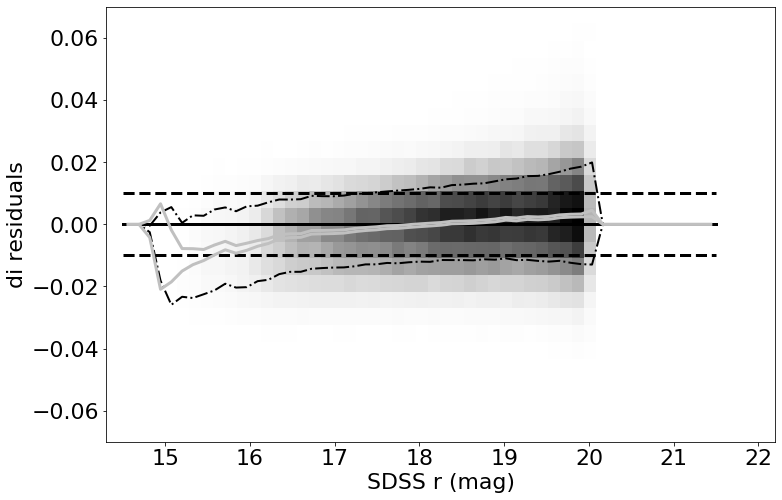

made plot colorResidDES2bright_di_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: -7.043399999635824e-06 std.dev.All: 0.0194498905984495
N= 302971 min= -0.2936875905000022 max= 0.2838852730000009
median: -0.004328614124999328 std.dev: 0.013653912386016426
saved plot as: colorResidDES2bright_dz_RA.png


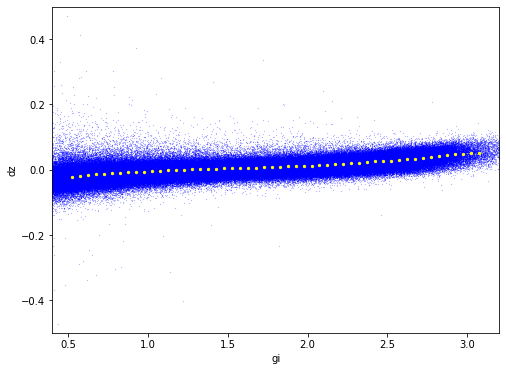

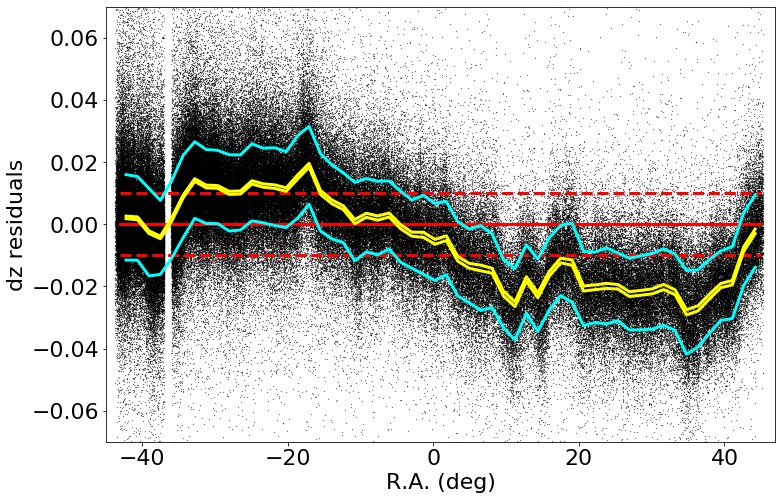

made plot colorResidDES2bright_dz_RA.png
medianAll: -7.043399999635824e-06 std.dev.All: 0.0194498905984495
N= 302971 min= -0.2936875905000022 max= 0.2838852730000009
median: -0.0041735387999979 std.dev: 0.013641462514378533
saved plot as: colorResidDES2bright_dz_RA_Hess.png


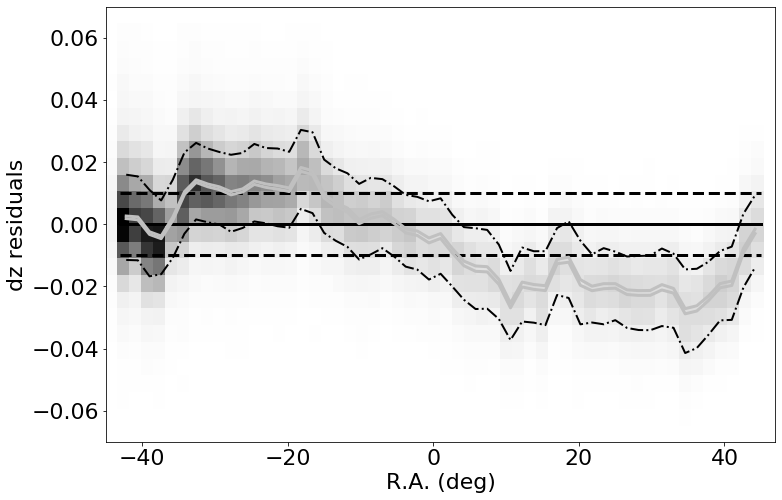

made plot colorResidDES2bright_dz_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -7.043399999635824e-06 std.dev.All: 0.0194498905984495
N= 302971 min= -0.2936875905000022 max= 0.2838852730000009
median: 0.0005969662999997221 std.dev: 0.0035687308630777026
saved plot as: colorResidDES2bright_dz_Dec.png


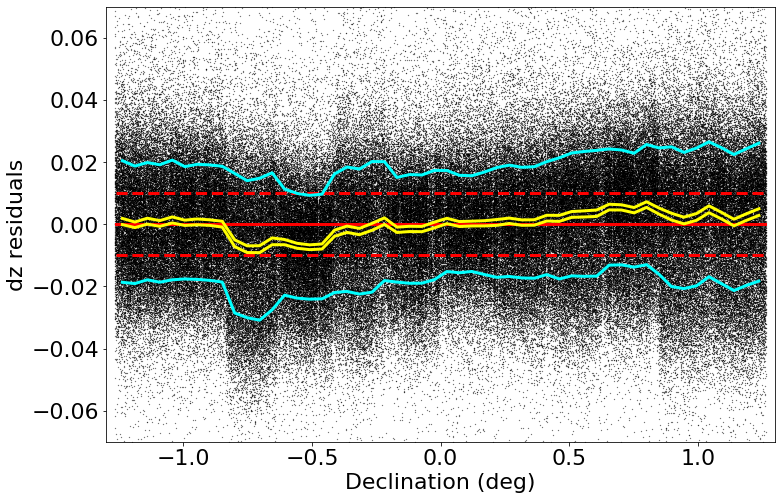

made plot colorResidDES2bright_dz_Dec.png
medianAll: -7.043399999635824e-06 std.dev.All: 0.0194498905984495
N= 302971 min= -0.2936875905000022 max= 0.2838852730000009
median: 0.0007616630999987984 std.dev: 0.003595384818671831
saved plot as: colorResidDES2bright_dz_Dec_Hess.png


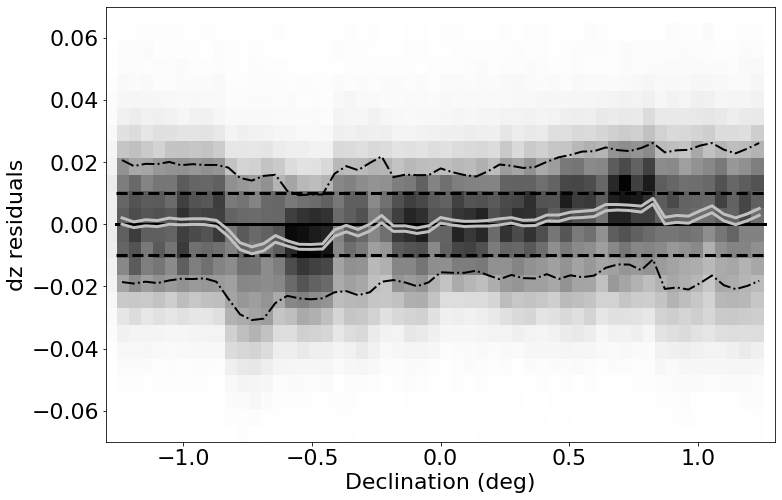

made plot colorResidDES2bright_dz_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -7.043399999635824e-06 std.dev.All: 0.0194498905984495
N= 302971 min= -0.2936875905000022 max= 0.2838852730000009
median: -0.00028472524999985144 std.dev: 0.004004775849958967
saved plot as: colorResidDES2bright_dz_rmag.png


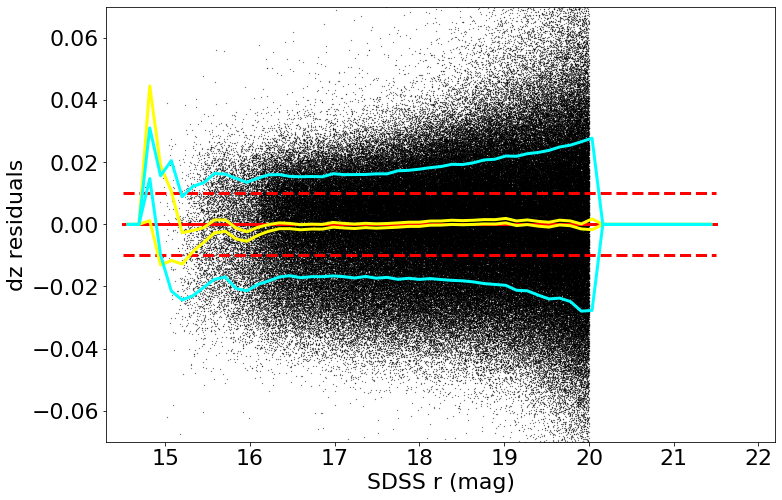

made plot colorResidDES2bright_dz_rmag.png
medianAll: -7.043399999635824e-06 std.dev.All: 0.0194498905984495
N= 302971 min= -0.2936875905000022 max= 0.2838852730000009
median: -0.00028472524999985144 std.dev: 0.004004775849958967
saved plot as: colorResidDES2bright_dz_rmag_Hess.png


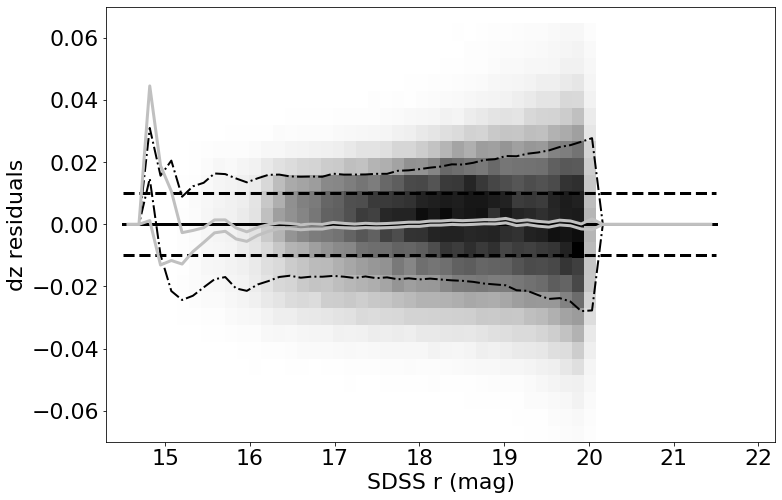

made plot colorResidDES2bright_dz_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dgr ===================
 stats for RA binning medians:
medianAll: 3.0374500032777016e-06 std.dev.All: 0.014485033599078932
N= 302986 min= -0.283108747499999 max= 0.2908760135999974
median: -4.4387624998306046e-05 std.dev: 0.005198363210707215
saved plot as: colorResidDES2bright_dgr_RA.png


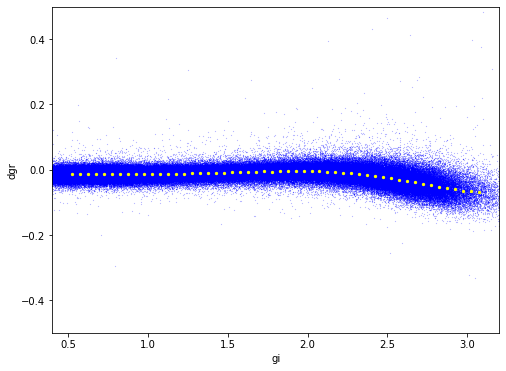

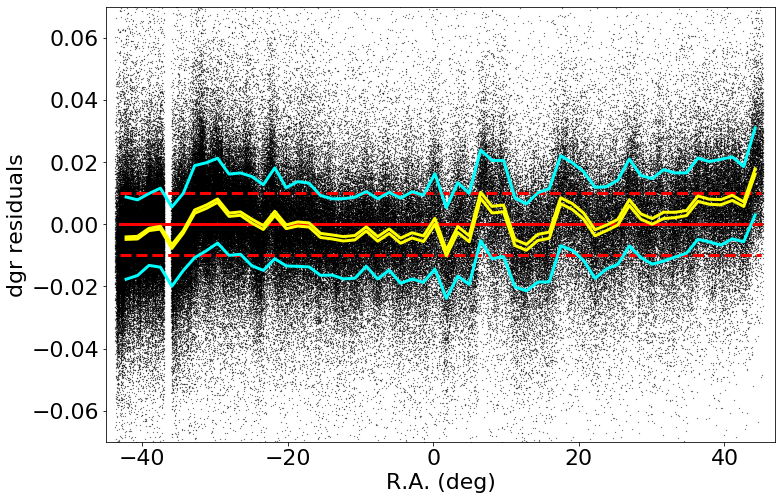

made plot colorResidDES2bright_dgr_RA.png
medianAll: 3.0374500032777016e-06 std.dev.All: 0.014485033599078932
N= 302986 min= -0.283108747499999 max= 0.2908760135999974
median: -0.0008668955999971972 std.dev: 0.004969391853965365
saved plot as: colorResidDES2bright_dgr_RA_Hess.png


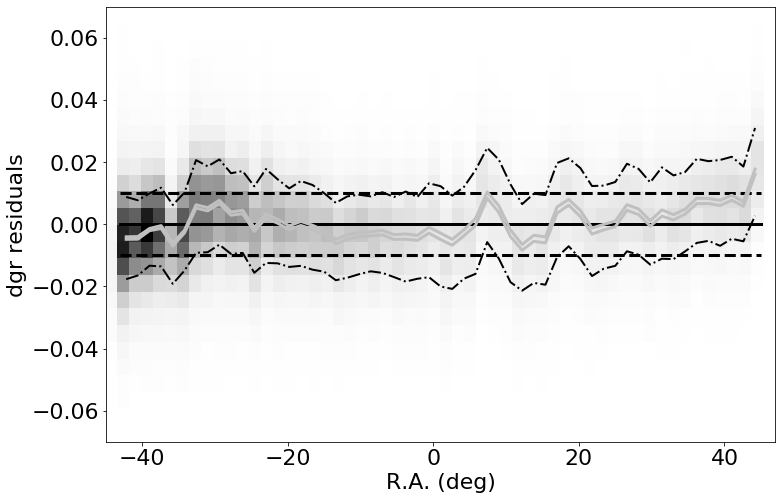

made plot colorResidDES2bright_dgr_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 3.0374500032777016e-06 std.dev.All: 0.014485033599078932
N= 302986 min= -0.283108747499999 max= 0.2908760135999974
median: 0.0005322235499999727 std.dev: 0.0015688230424717596
saved plot as: colorResidDES2bright_dgr_Dec.png


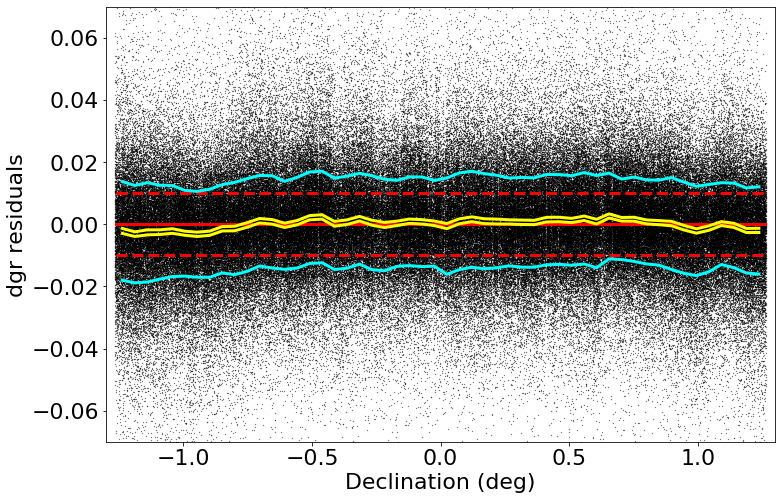

made plot colorResidDES2bright_dgr_Dec.png
medianAll: 3.0374500032777016e-06 std.dev.All: 0.014485033599078932
N= 302986 min= -0.283108747499999 max= 0.2908760135999974
median: 0.0004975497999991623 std.dev: 0.0015894377391089567
saved plot as: colorResidDES2bright_dgr_Dec_Hess.png


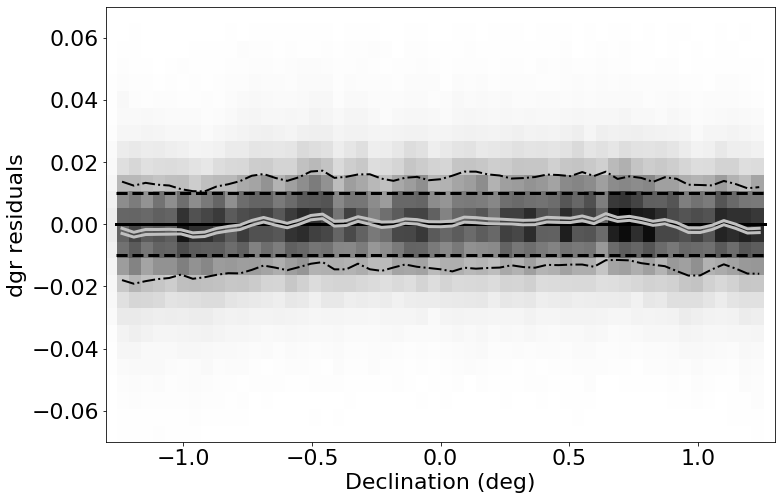

made plot colorResidDES2bright_dgr_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 3.0374500032777016e-06 std.dev.All: 0.014485033599078932
N= 302986 min= -0.283108747499999 max= 0.2908760135999974
median: 0.00020602194999954629 std.dev: 0.0034802852251994104
saved plot as: colorResidDES2bright_dgr_rmag.png


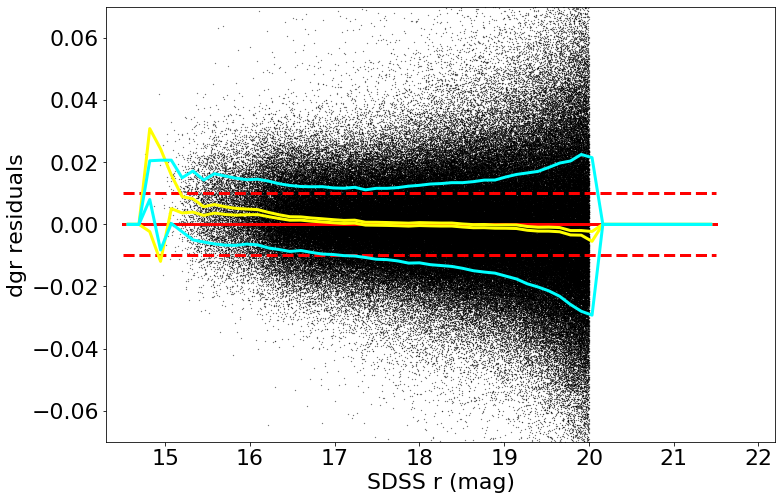

made plot colorResidDES2bright_dgr_rmag.png
medianAll: 3.0374500032777016e-06 std.dev.All: 0.014485033599078932
N= 302986 min= -0.283108747499999 max= 0.2908760135999974
median: 0.00020602194999954629 std.dev: 0.0034802852251994104
saved plot as: colorResidDES2bright_dgr_rmag_Hess.png


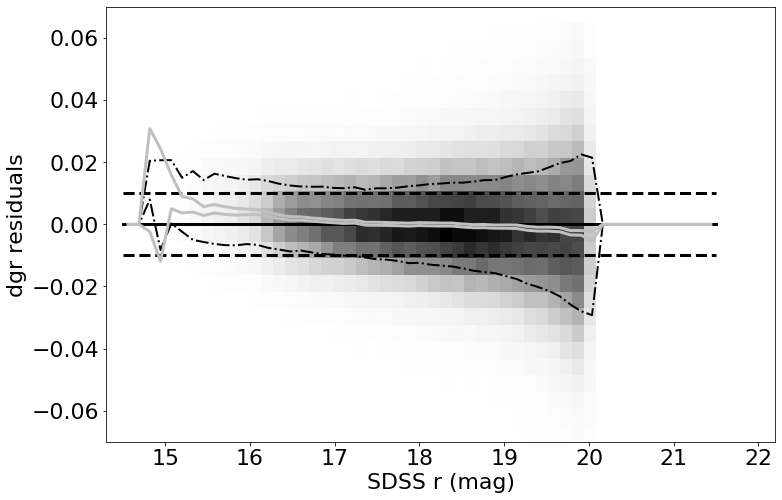

made plot colorResidDES2bright_dgr_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: dri ===================
 stats for RA binning medians:
medianAll: -3.883500000530227e-06 std.dev.All: 0.011950446211279395
N= 303000 min= -0.27514220939999945 max= 0.28863301559999593
median: 0.0018761692500028852 std.dev: 0.005230169980333475
saved plot as: colorResidDES2bright_dri_RA.png


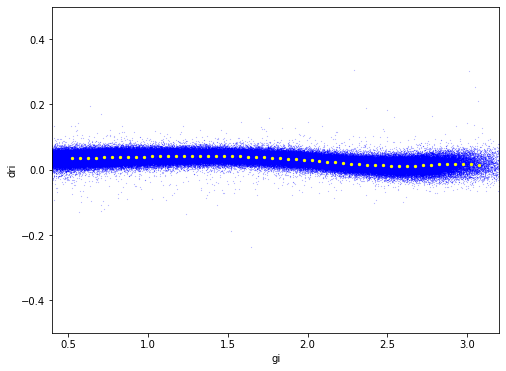

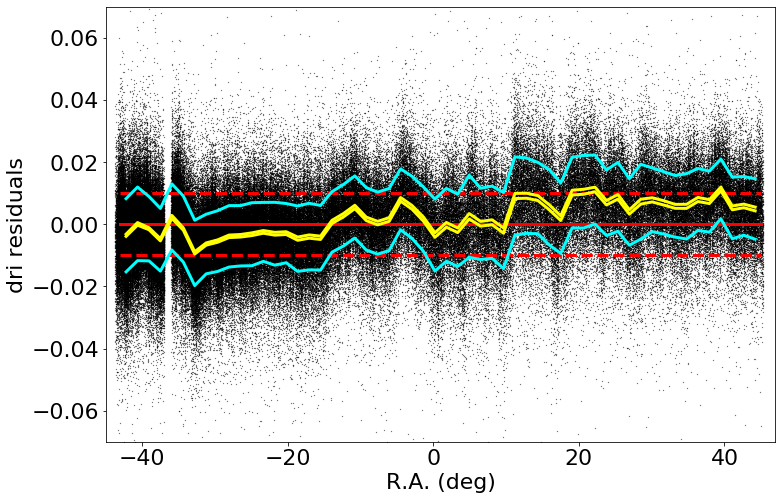

made plot colorResidDES2bright_dri_RA.png
medianAll: -3.883500000530227e-06 std.dev.All: 0.011950446211279395
N= 303000 min= -0.27514220939999945 max= 0.28863301559999593
median: 0.0026524449000012856 std.dev: 0.00522720668376836
saved plot as: colorResidDES2bright_dri_RA_Hess.png


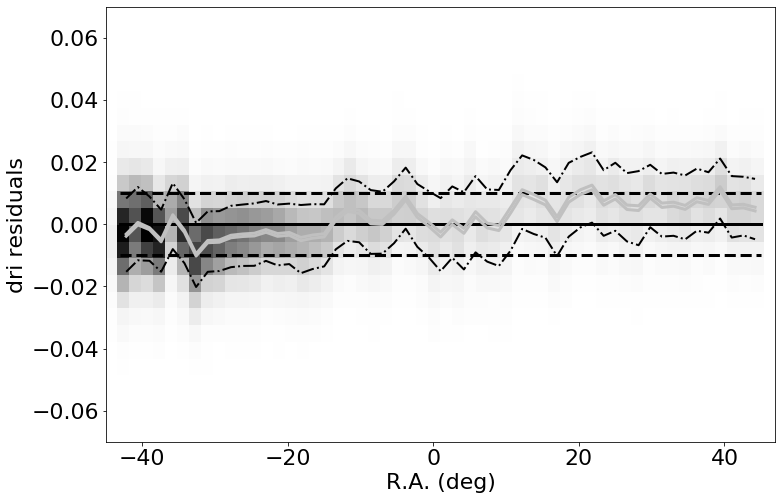

made plot colorResidDES2bright_dri_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: -3.883500000530227e-06 std.dev.All: 0.011950446211279395
N= 303000 min= -0.27514220939999945 max= 0.28863301559999593
median: 0.0001828817250005897 std.dev: 0.0011954105526797048
saved plot as: colorResidDES2bright_dri_Dec.png


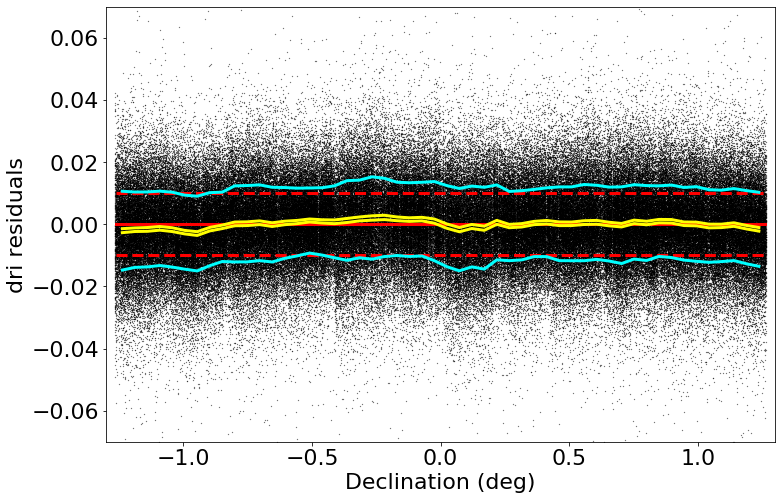

made plot colorResidDES2bright_dri_Dec.png
medianAll: -3.883500000530227e-06 std.dev.All: 0.011950446211279395
N= 303000 min= -0.27514220939999945 max= 0.28863301559999593
median: 0.00022738420000222026 std.dev: 0.0012348669827628278
saved plot as: colorResidDES2bright_dri_Dec_Hess.png


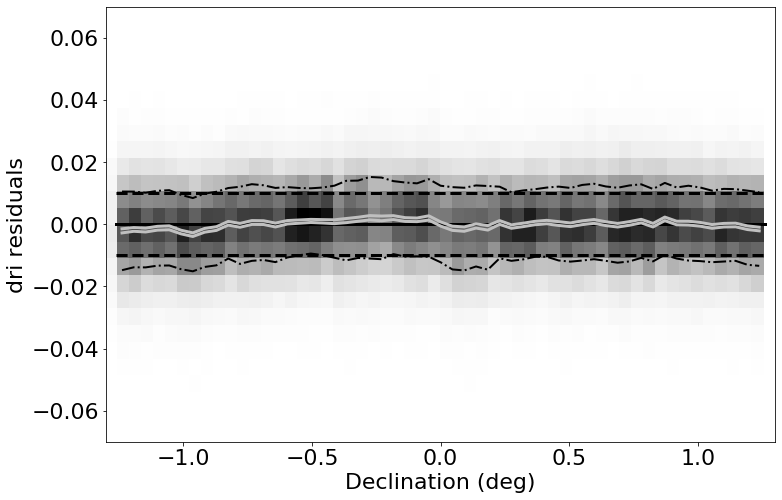

made plot colorResidDES2bright_dri_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: -3.883500000530227e-06 std.dev.All: 0.011950446211279395
N= 303000 min= -0.27514220939999945 max= 0.28863301559999593
median: 0.0004839346499999186 std.dev: 0.0022447523639769914
saved plot as: colorResidDES2bright_dri_rmag.png


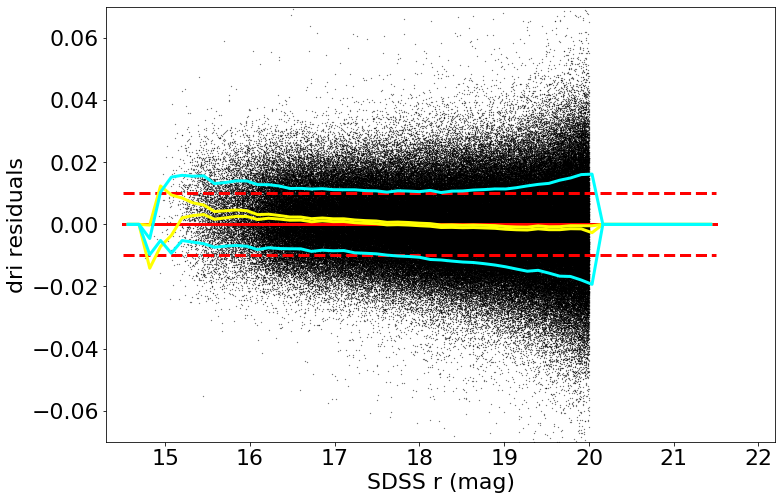

made plot colorResidDES2bright_dri_rmag.png
medianAll: -3.883500000530227e-06 std.dev.All: 0.011950446211279395
N= 303000 min= -0.27514220939999945 max= 0.28863301559999593
median: 0.0004839346499999186 std.dev: 0.0022447523639769914
saved plot as: colorResidDES2bright_dri_rmag_Hess.png


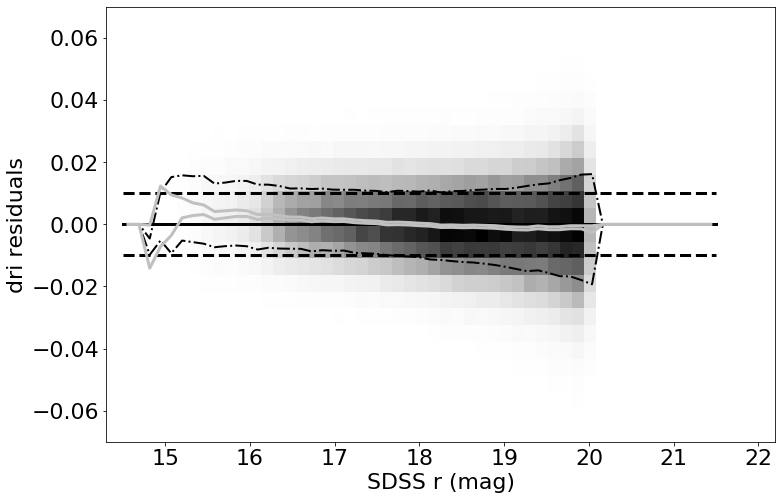

made plot colorResidDES2bright_dri_rmag_Hess.png
------------------------------------------------------------------
=========== WORKING ON: diz ===================
 stats for RA binning medians:
medianAll: 9.815000027325188e-07 std.dev.All: 0.01581578338372342
N= 302980 min= -0.2790674759999987 max= 0.18242668130000078
median: 8.637220000091723e-05 std.dev: 0.008260898109289757
saved plot as: colorResidDES2bright_diz_RA.png


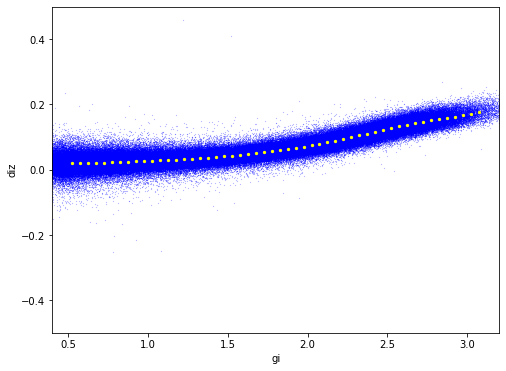

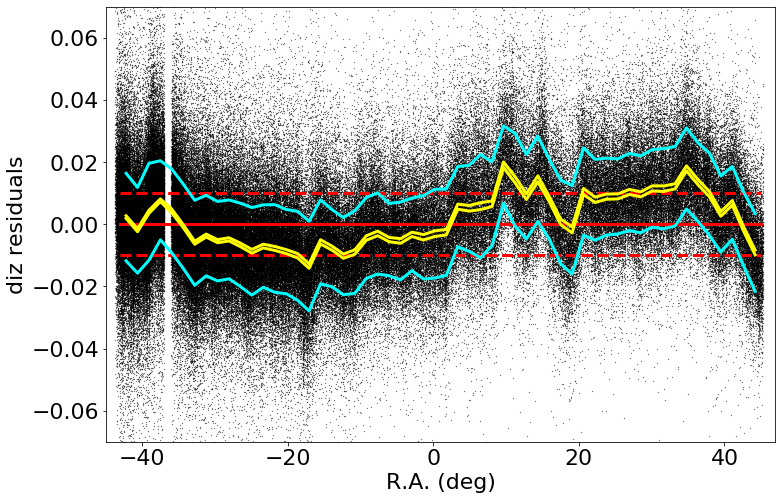

made plot colorResidDES2bright_diz_RA.png
medianAll: 9.815000027325188e-07 std.dev.All: 0.01581578338372342
N= 302980 min= -0.2790674759999987 max= 0.18242668130000078
median: 0.001979733950001115 std.dev: 0.008218616577554067
saved plot as: colorResidDES2bright_diz_RA_Hess.png


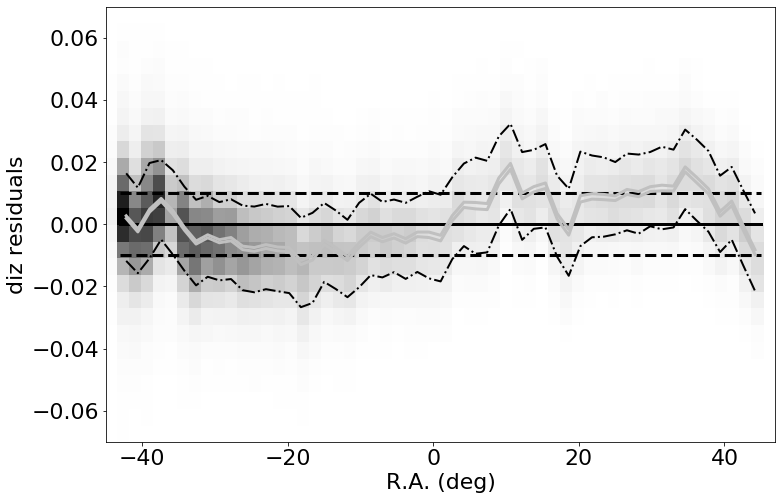

made plot colorResidDES2bright_diz_RA_Hess.png
-----------
 stats for Dec binning medians:
medianAll: 9.815000027325188e-07 std.dev.All: 0.01581578338372342
N= 302980 min= -0.2790674759999987 max= 0.18242668130000078
median: -0.00027147897500008535 std.dev: 0.0026413494556625536
saved plot as: colorResidDES2bright_diz_Dec.png


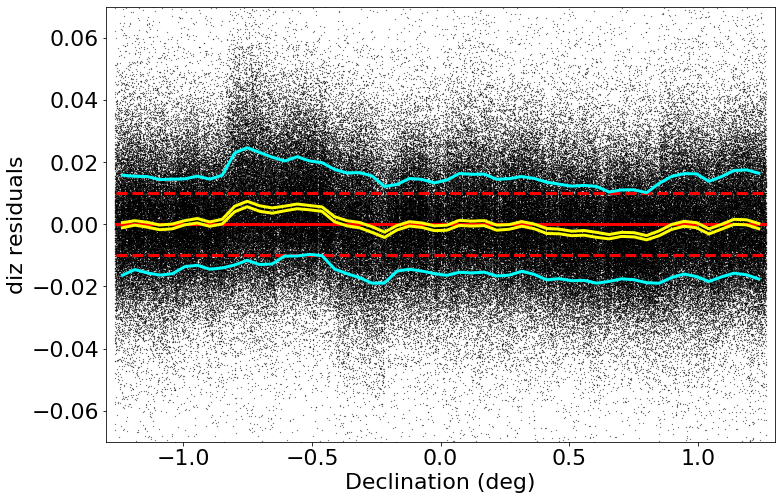

made plot colorResidDES2bright_diz_Dec.png
medianAll: 9.815000027325188e-07 std.dev.All: 0.01581578338372342
N= 302980 min= -0.2790674759999987 max= 0.18242668130000078
median: -0.0003072450000018989 std.dev: 0.002674348811239167
saved plot as: colorResidDES2bright_diz_Dec_Hess.png


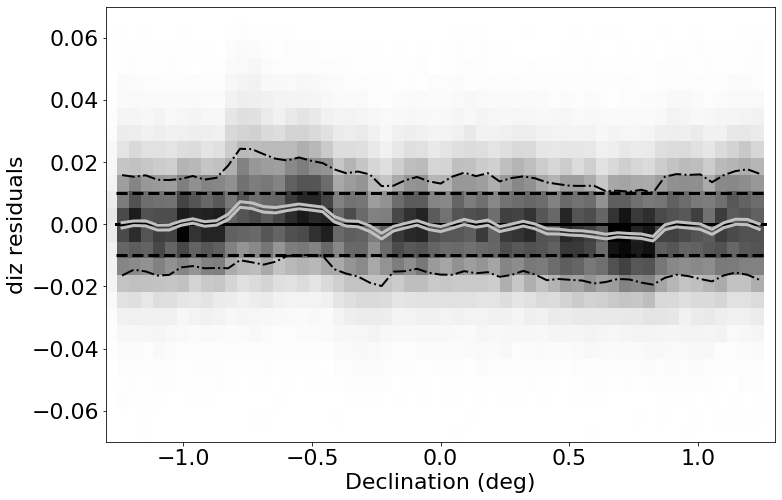

made plot colorResidDES2bright_diz_Dec_Hess.png
-----------
 stats for SDSS r binning medians:
medianAll: 9.815000027325188e-07 std.dev.All: 0.01581578338372342
N= 302980 min= -0.2790674759999987 max= 0.18242668130000078
median: -0.0002617483500006127 std.dev: 0.004811298014025988
saved plot as: colorResidDES2bright_diz_rmag.png


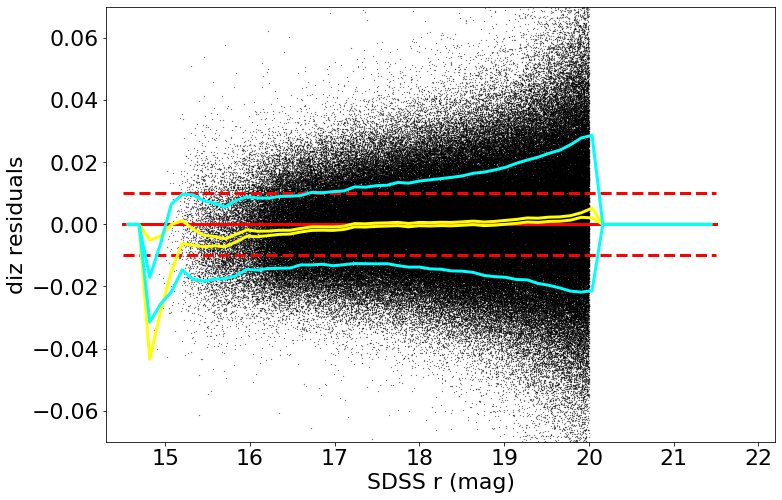

made plot colorResidDES2bright_diz_rmag.png
medianAll: 9.815000027325188e-07 std.dev.All: 0.01581578338372342
N= 302980 min= -0.2790674759999987 max= 0.18242668130000078
median: -0.0002617483500006127 std.dev: 0.004811298014025988
saved plot as: colorResidDES2bright_diz_rmag_Hess.png


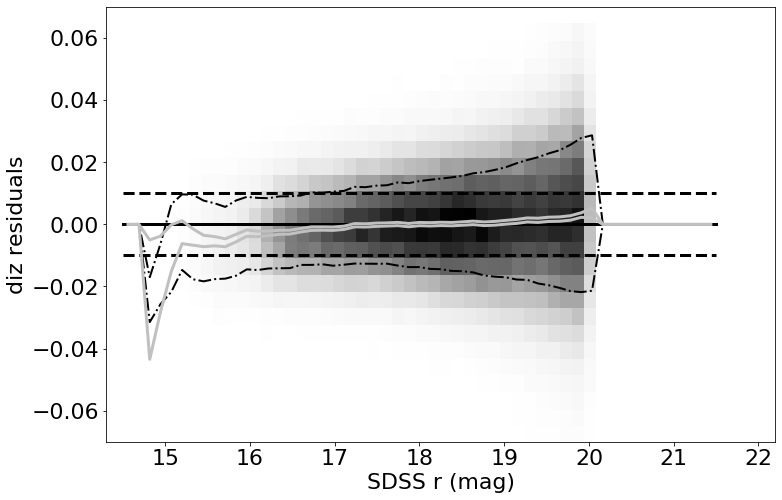

made plot colorResidDES2bright_diz_rmag_Hess.png
------------------------------------------------------------------


In [14]:
keywords = {"Xstr":'gi', "plotNameRoot":'colorResidDES2bright_', "symbSize":0.05}
for color in ('dg', 'dr', 'di', 'dz', 'dgr', 'dri', 'diz'):
    keywords["Ystr"] = color 
    doOneColor(sdssDESbright, keywords)